In [1]:
from __future__ import division
from __future__ import print_function
import scipy
from scipy.special import jv
from scipy.fftpack import *
import numpy as np
import matplotlib.pyplot as plt
import ehtim as eh
from ehtim.calibrating import self_cal as sc
import ehtim.observing.pulses as pl
from ehtim.const_def import *
import matplotlib.pyplot as plt
import numpy as np
import ehtim as eh
from   ehtim.calibrating import self_cal as sc
import time
#from  ehtim.plotting import self_cal as sc
plt.close('all')

ttype = 'direct'

Welcome to eht-imaging! v 1.2.6 



In [2]:
# Load the image and the array
#im = eh.image.load_txt('/home/alex/Videos/eht-imaging-dev/models/roman_eofn.txt')
eht = eh.array.load_txt('/home/alex/Videos/eht-imaging-dev/arrays/EHT2017.txt')

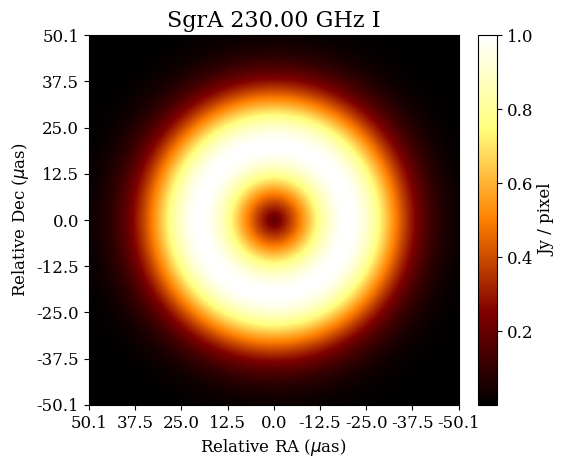

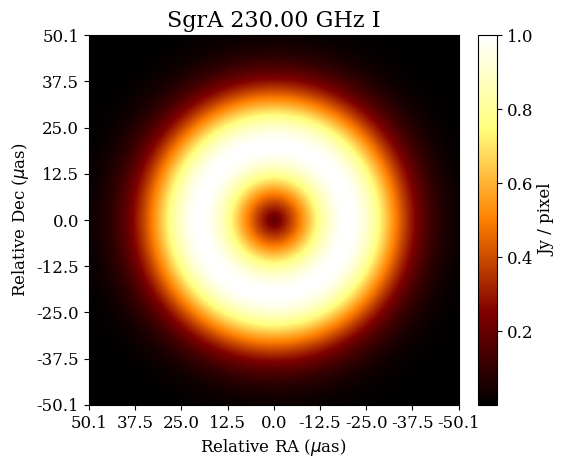

In [3]:
x = np.linspace(-50,50,1000)
muas2rad = 1e-6/3600*np.pi/180
x *= muas2rad
X,Y = np.meshgrid(x,x)
R = np.sqrt(X**2+Y**2)
psize = np.diff(x)[0]
umax = 1./psize/2.
umin = 1./(np.amax(x)-np.amin(x))
#def Gaussian2d(x,y,sigma,x_offset,y_offset):
#       return np.exp(-((x + x_offset)**2 + (y + y_offset)**2) / (sigma / 0.5)**2)
def Gaussian(x,sigma):
    return np.exp(-x**2/(2*sigma**2))

def Gaussian2d(x,y,sigma,x_offset,y_offset):
       return np.exp(-((x + x_offset)**2 + (y + y_offset)**2) / (sigma / 0.5)**2)


image = np.zeros(np.shape(X)) # start with empty image
image += Gaussian(R-20*muas2rad,11*muas2rad) # add circle
#image += Gaussian2d(X,Y,4.*muas2rad,20.*muas2rad,0.*muas2rad) # add 2D Gaussian
im = eh.image.Image(image[:,:],psize,RA_DEFAULT,DEC_DEFAULT,RF_DEFAULT, mjd=MJD_DEFAULT,pulse=pl.deltaPulse2D)
im.display()


In [4]:
tint_sec = 5
tadv_sec = 600
tstart_hr = 0
tstop_hr = 24
bw_hz = 4e9
obs = im.observe(eht, tint_sec, tadv_sec, tstart_hr, tstop_hr, bw_hz,
                 sgrscat=False, ampcal=True, phasecal=False)


Generating empty observation file . . . 
Producing clean visibilities from image with nfft FT . . . 
Adding gain + phase errors to data and applying a priori calibration . . . 
   Applying atmospheric phase corruption: phasecal-->False
Adding thermal noise to data . . . 


Clean beam parameters:  [1.19728384e-10 7.88252023e-11 1.38129500e+00]
Nominal Resolution:  1.1454591407637095e-10
Generating I image...
Initial S_1: 0.000000 S_2: 0.000000 S_3: 0.000000
Initial Chi^2_1: 6434027591448.599609 Chi^2_2: 1.000000 Chi^2_3: 1.000000
Initial Objective Function: 643402759144760.000000
Total Data 1:  645
Total Pixel #:  16384
Clipped Pixel #:  16384

i: 0 chi2_1: 6434027591448.60 chi2_2: 1.00 chi2_3: 1.00 s_1: 0.00 s_2: 0.00 s_3: 0.00


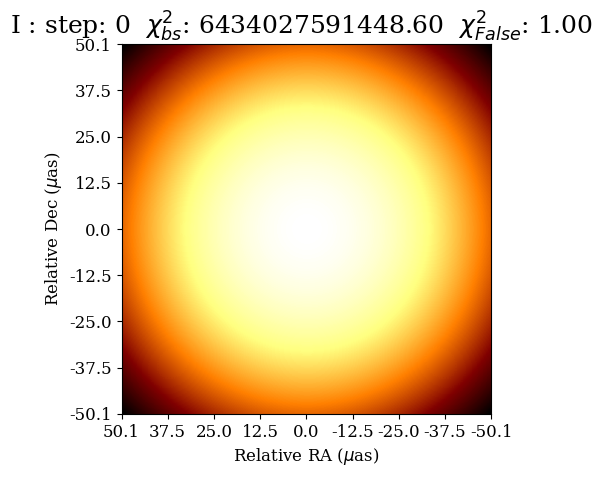

i: 1 chi2_1: 6403741199076.64 chi2_2: 1.00 chi2_3: 1.00 s_1: 167.61 s_2: 0.00 s_3: 0.00


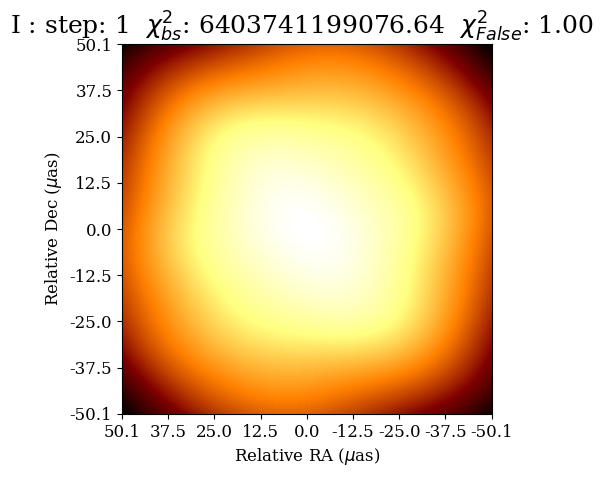

i: 2 chi2_1: 6392462619393.52 chi2_2: 1.00 chi2_3: 1.00 s_1: 171.37 s_2: 0.00 s_3: 0.00


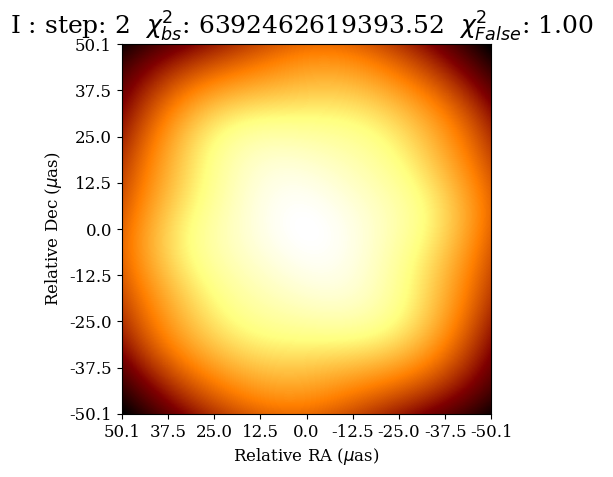

i: 3 chi2_1: 6331838657756.47 chi2_2: 1.00 chi2_3: 1.00 s_1: 714.78 s_2: 0.00 s_3: 0.00


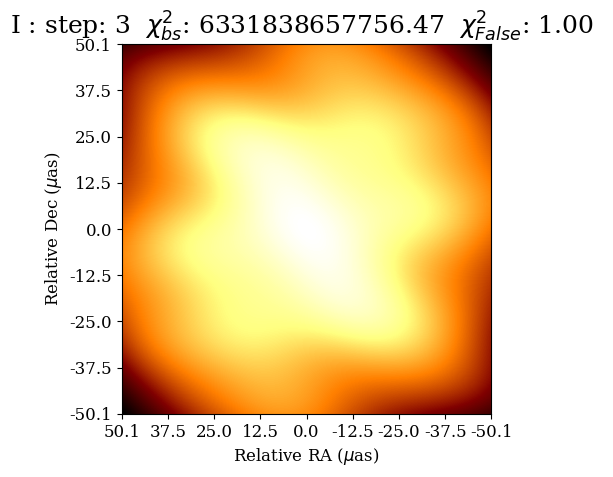

i: 4 chi2_1: 6243662509607.59 chi2_2: 1.00 chi2_3: 1.00 s_1: 2094.00 s_2: 0.00 s_3: 0.00


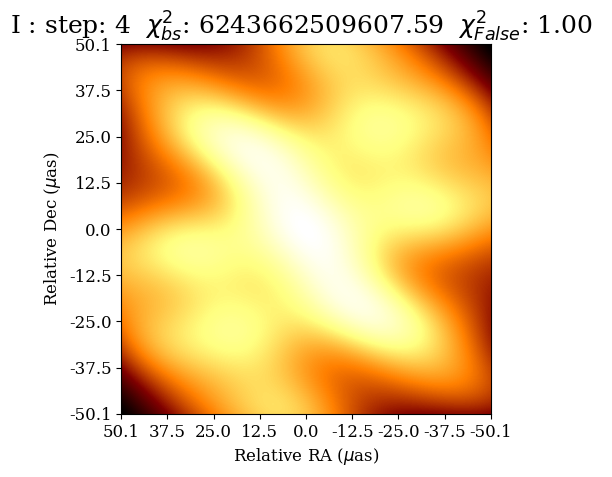

i: 5 chi2_1: 6056393764921.81 chi2_2: 1.00 chi2_3: 1.00 s_1: 8871.29 s_2: 0.00 s_3: 0.00


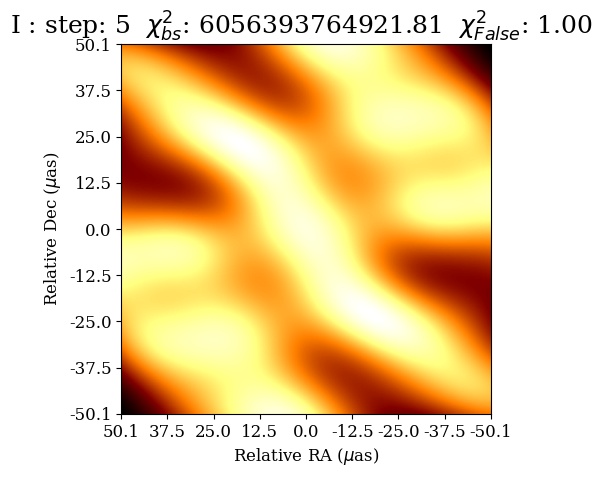

i: 6 chi2_1: 5345892223882.69 chi2_2: 1.00 chi2_3: 1.00 s_1: 21319.59 s_2: 0.00 s_3: 0.00


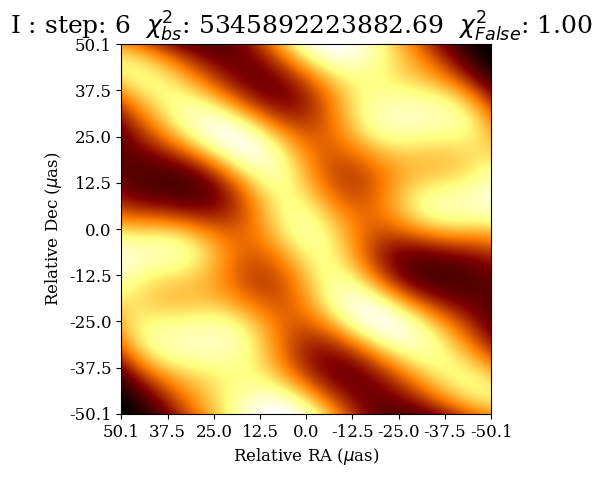

i: 7 chi2_1: 4625582947095.20 chi2_2: 1.00 chi2_3: 1.00 s_1: 37575.25 s_2: 0.00 s_3: 0.00


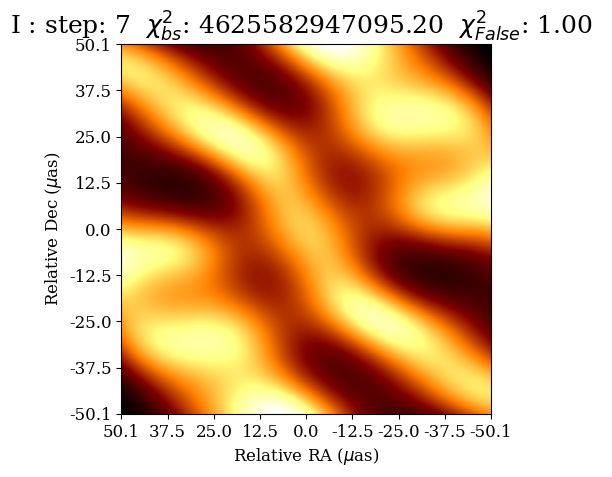

i: 8 chi2_1: 4224038825602.78 chi2_2: 1.00 chi2_3: 1.00 s_1: 31752.72 s_2: 0.00 s_3: 0.00


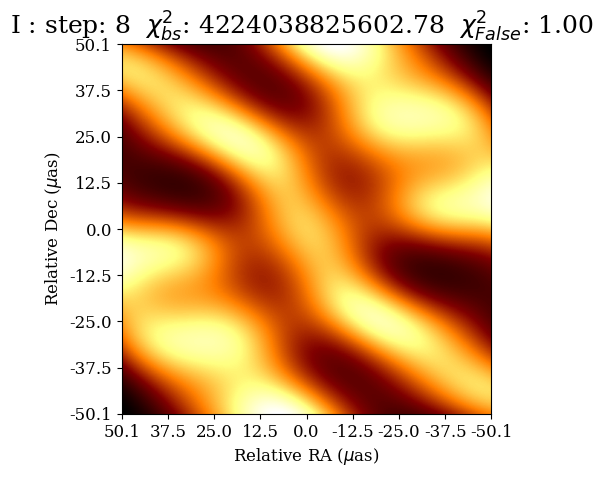

i: 9 chi2_1: 4039198879040.98 chi2_2: 1.00 chi2_3: 1.00 s_1: 40946.80 s_2: 0.00 s_3: 0.00


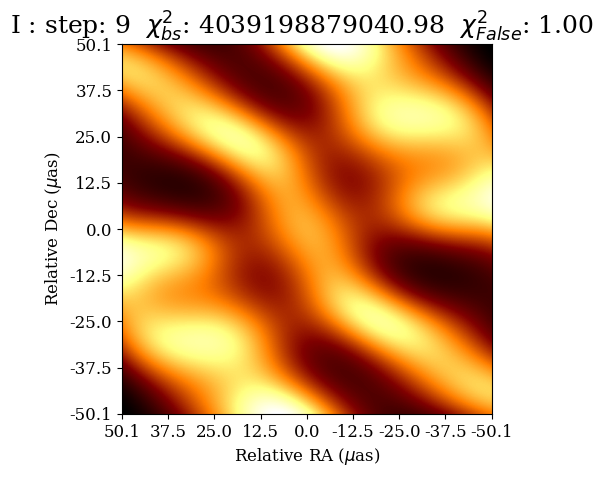

i: 10 chi2_1: 3755815658591.02 chi2_2: 1.00 chi2_3: 1.00 s_1: 45728.21 s_2: 0.00 s_3: 0.00


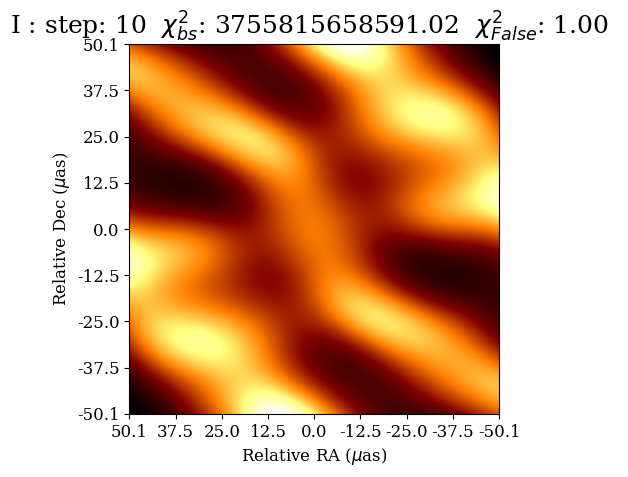

i: 11 chi2_1: 3676586442815.57 chi2_2: 1.00 chi2_3: 1.00 s_1: 42525.72 s_2: 0.00 s_3: 0.00


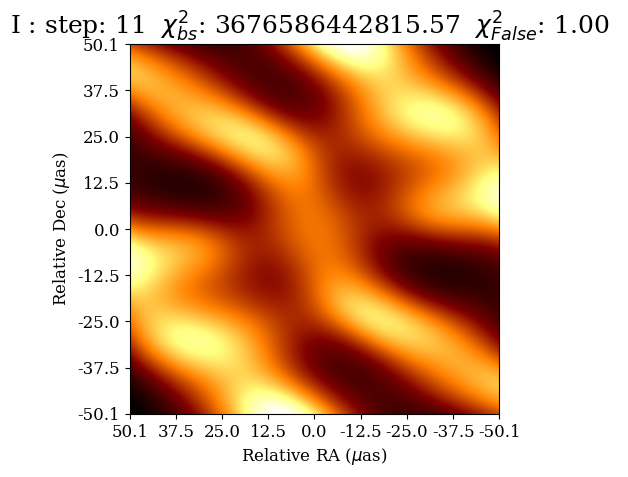

i: 12 chi2_1: 3502469537387.16 chi2_2: 1.00 chi2_3: 1.00 s_1: 43231.85 s_2: 0.00 s_3: 0.00


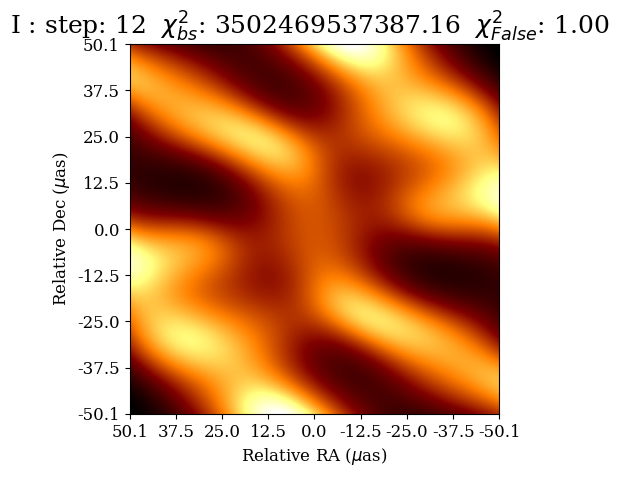

i: 13 chi2_1: 3166992943864.08 chi2_2: 1.00 chi2_3: 1.00 s_1: 49734.22 s_2: 0.00 s_3: 0.00


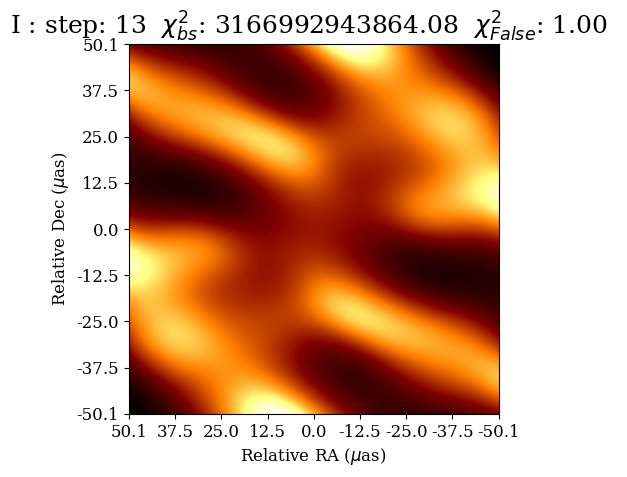

i: 14 chi2_1: 3055500399740.18 chi2_2: 1.00 chi2_3: 1.00 s_1: 55149.10 s_2: 0.00 s_3: 0.00


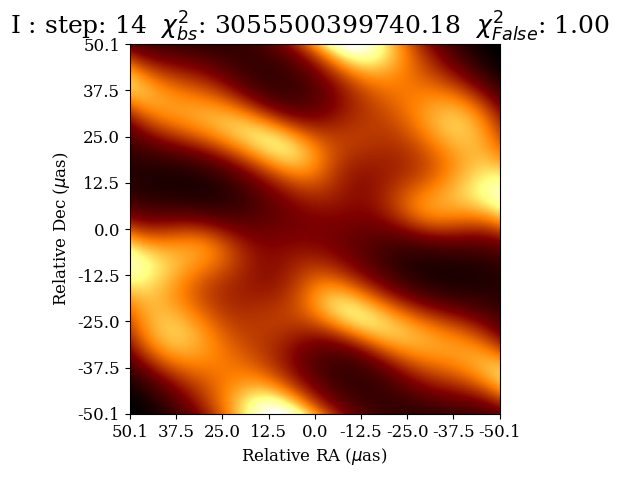

i: 15 chi2_1: 2893205557194.36 chi2_2: 1.00 chi2_3: 1.00 s_1: 60556.51 s_2: 0.00 s_3: 0.00


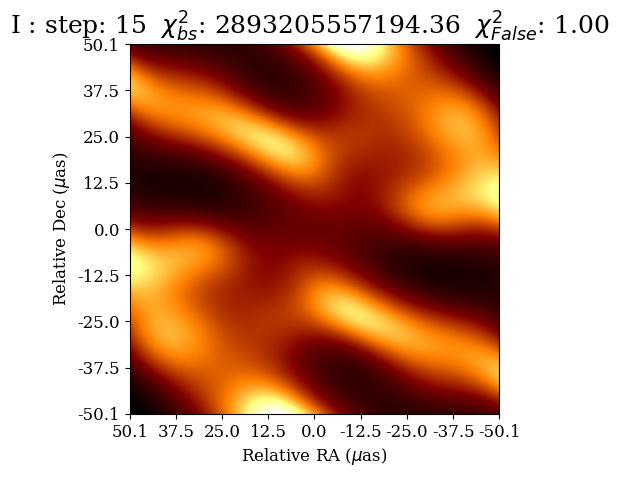

i: 16 chi2_1: 2601365035201.73 chi2_2: 1.00 chi2_3: 1.00 s_1: 73474.71 s_2: 0.00 s_3: 0.00


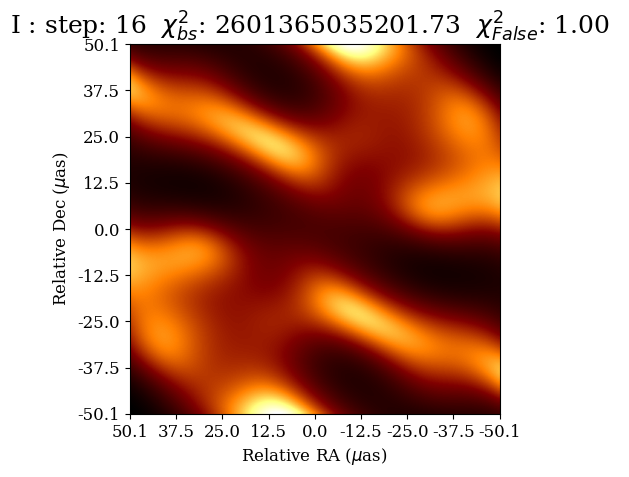

i: 17 chi2_1: 2536153307672.49 chi2_2: 1.00 chi2_3: 1.00 s_1: 74095.05 s_2: 0.00 s_3: 0.00


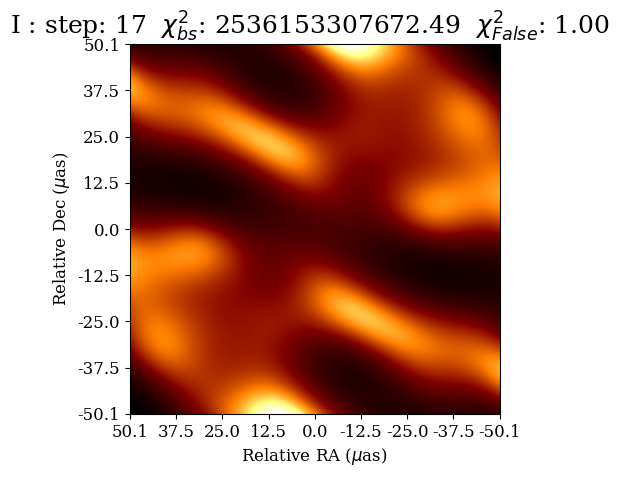

i: 18 chi2_1: 2478462978616.27 chi2_2: 1.00 chi2_3: 1.00 s_1: 75665.05 s_2: 0.00 s_3: 0.00


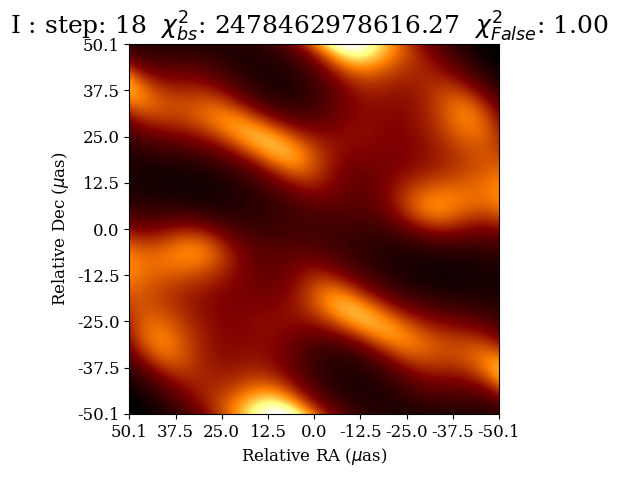

i: 19 chi2_1: 2436684422098.74 chi2_2: 1.00 chi2_3: 1.00 s_1: 78752.80 s_2: 0.00 s_3: 0.00


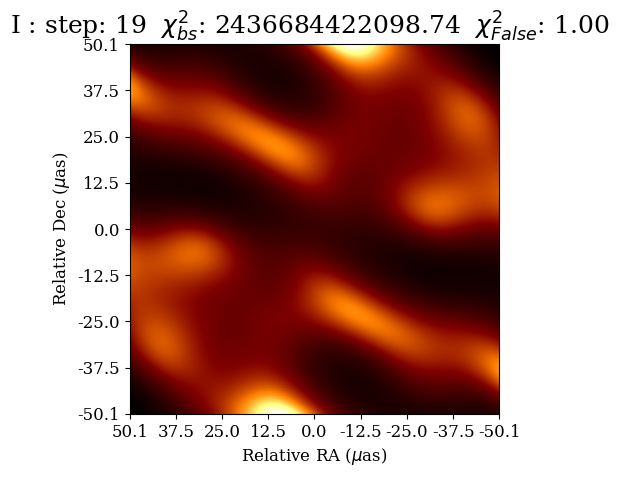

i: 20 chi2_1: 2406349463963.85 chi2_2: 1.00 chi2_3: 1.00 s_1: 75954.10 s_2: 0.00 s_3: 0.00


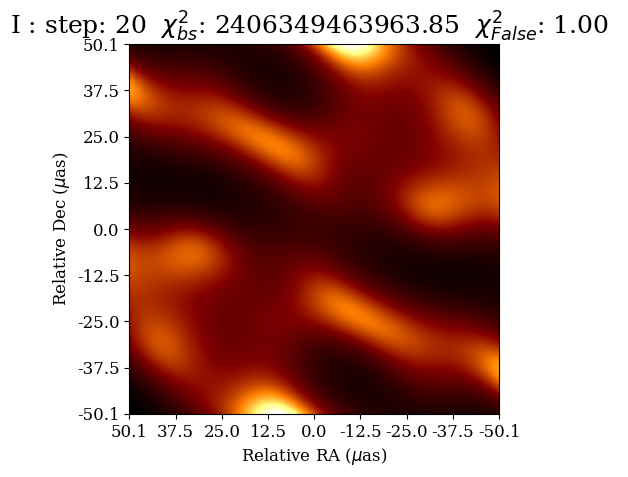

i: 21 chi2_1: 2377856022900.30 chi2_2: 1.00 chi2_3: 1.00 s_1: 77506.82 s_2: 0.00 s_3: 0.00


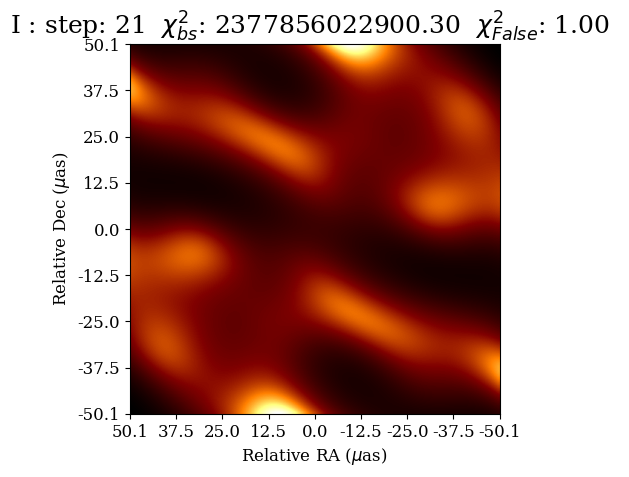

i: 22 chi2_1: 2356404930310.70 chi2_2: 1.00 chi2_3: 1.00 s_1: 80960.59 s_2: 0.00 s_3: 0.00


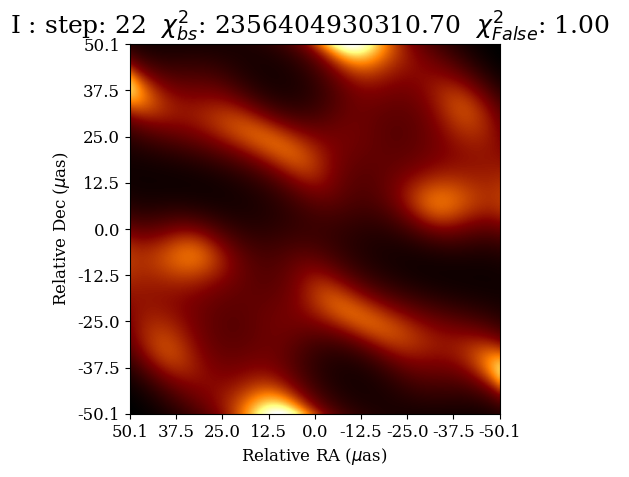

i: 23 chi2_1: 2346712476396.45 chi2_2: 1.00 chi2_3: 1.00 s_1: 81298.63 s_2: 0.00 s_3: 0.00


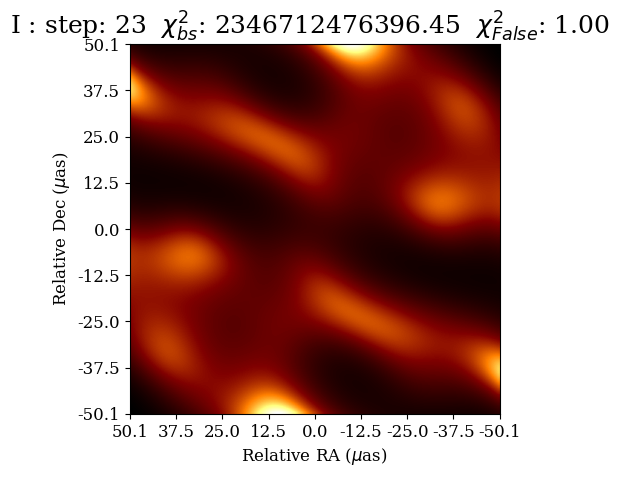

i: 24 chi2_1: 2343025534365.26 chi2_2: 1.00 chi2_3: 1.00 s_1: 81116.23 s_2: 0.00 s_3: 0.00


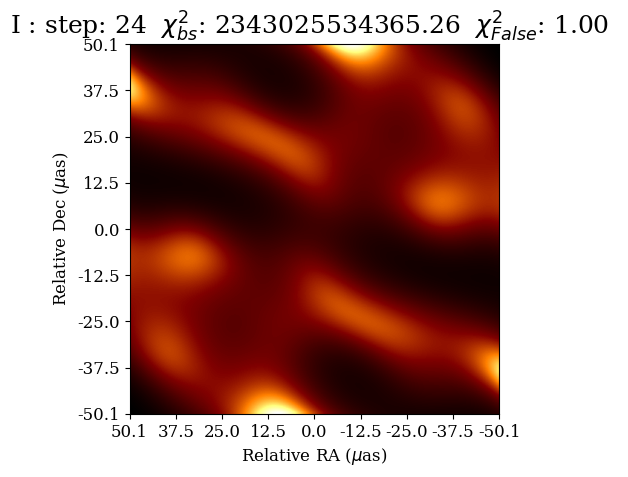

i: 25 chi2_1: 2341668205662.01 chi2_2: 1.00 chi2_3: 1.00 s_1: 80846.82 s_2: 0.00 s_3: 0.00


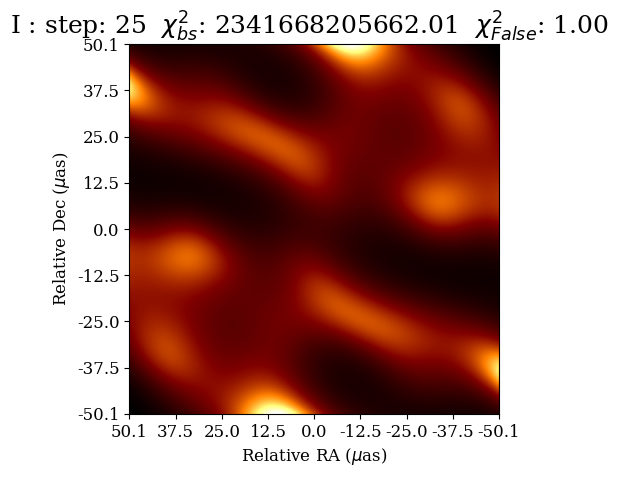

i: 26 chi2_1: 2336363522982.88 chi2_2: 1.00 chi2_3: 1.00 s_1: 80482.75 s_2: 0.00 s_3: 0.00


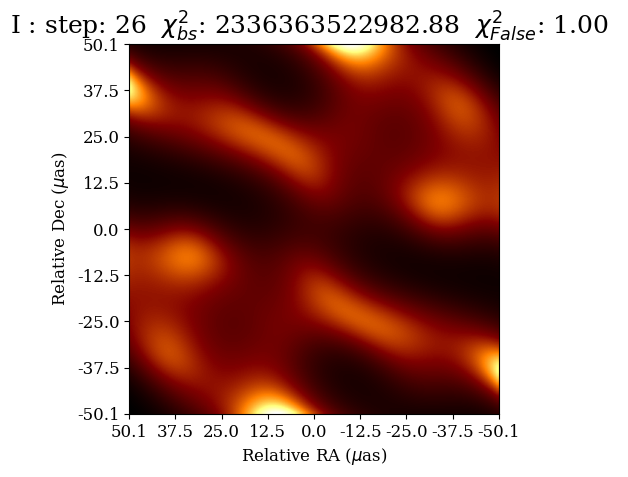

i: 27 chi2_1: 2326822933866.12 chi2_2: 1.00 chi2_3: 1.00 s_1: 80491.60 s_2: 0.00 s_3: 0.00


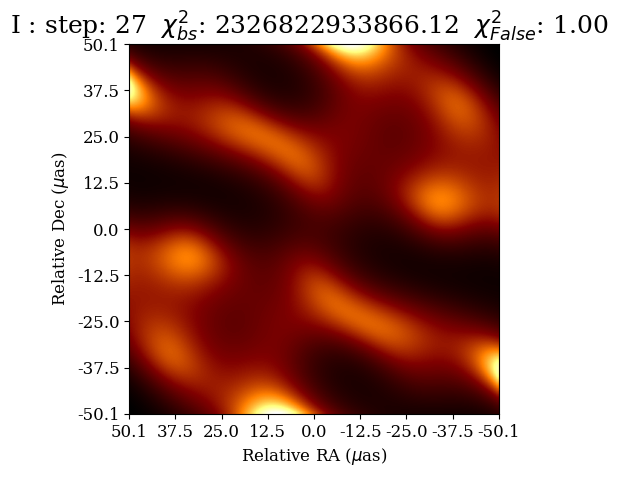

i: 28 chi2_1: 2306835325275.00 chi2_2: 1.00 chi2_3: 1.00 s_1: 82508.11 s_2: 0.00 s_3: 0.00


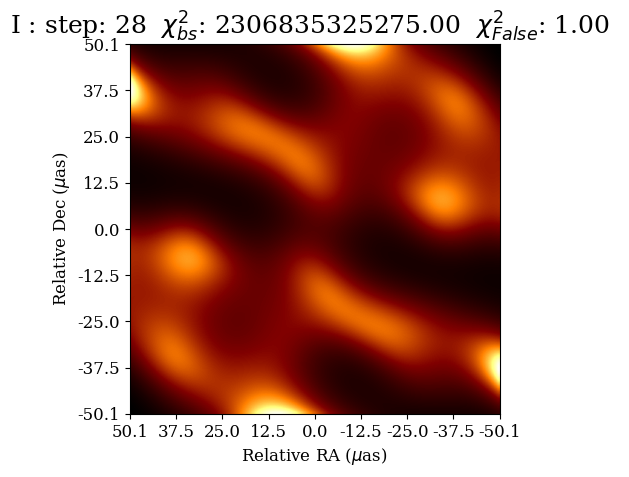

i: 29 chi2_1: 2269674645913.97 chi2_2: 1.00 chi2_3: 1.00 s_1: 90032.28 s_2: 0.00 s_3: 0.00


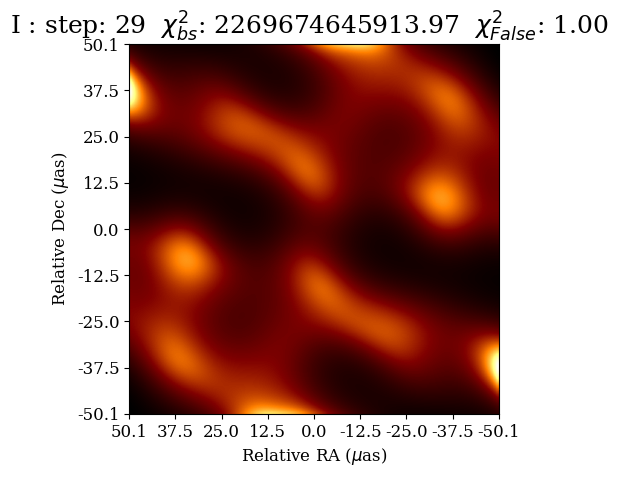

i: 30 chi2_1: 2240235804442.78 chi2_2: 1.00 chi2_3: 1.00 s_1: 101749.54 s_2: 0.00 s_3: 0.00


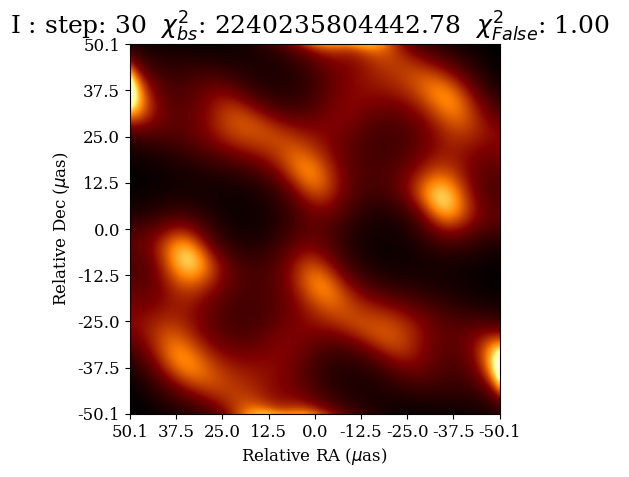

i: 31 chi2_1: 2232568195674.48 chi2_2: 1.00 chi2_3: 1.00 s_1: 95312.54 s_2: 0.00 s_3: 0.00


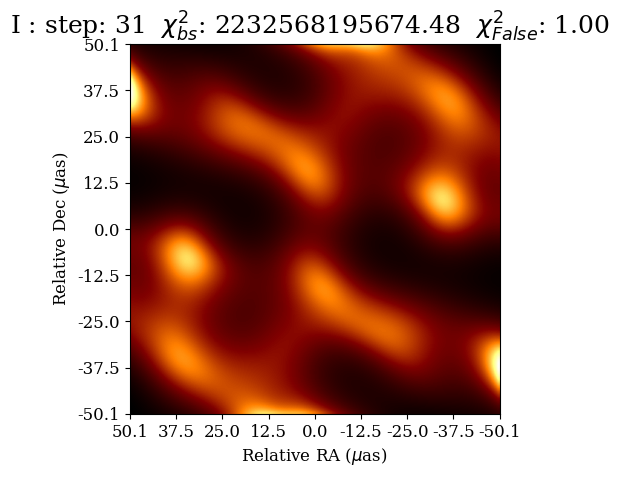

i: 32 chi2_1: 2222360908906.94 chi2_2: 1.00 chi2_3: 1.00 s_1: 96434.21 s_2: 0.00 s_3: 0.00


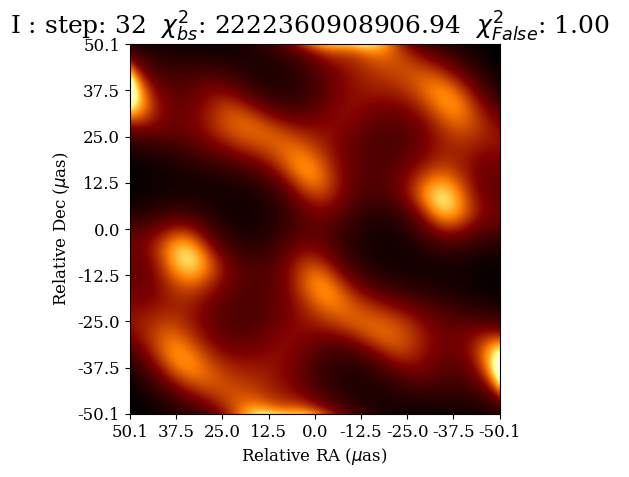

i: 33 chi2_1: 2209546805163.04 chi2_2: 1.00 chi2_3: 1.00 s_1: 101719.29 s_2: 0.00 s_3: 0.00


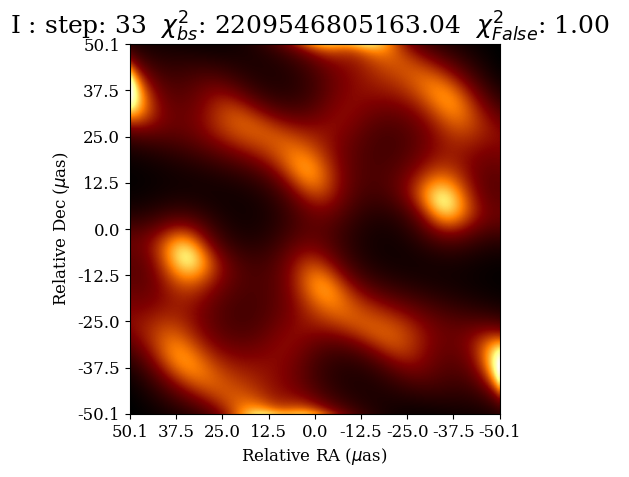

i: 34 chi2_1: 2204980385994.57 chi2_2: 1.00 chi2_3: 1.00 s_1: 101405.71 s_2: 0.00 s_3: 0.00


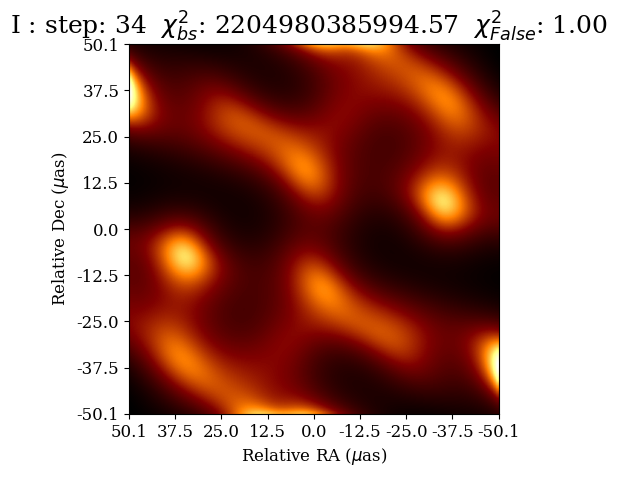

i: 35 chi2_1: 2197663800614.26 chi2_2: 1.00 chi2_3: 1.00 s_1: 100537.75 s_2: 0.00 s_3: 0.00


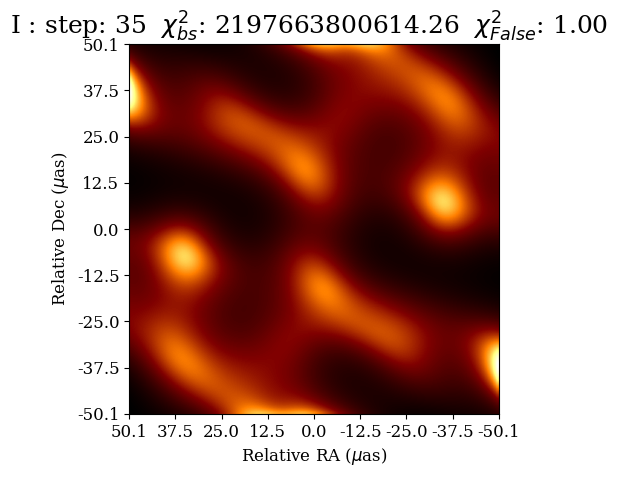

i: 36 chi2_1: 2189257619192.50 chi2_2: 1.00 chi2_3: 1.00 s_1: 101050.64 s_2: 0.00 s_3: 0.00


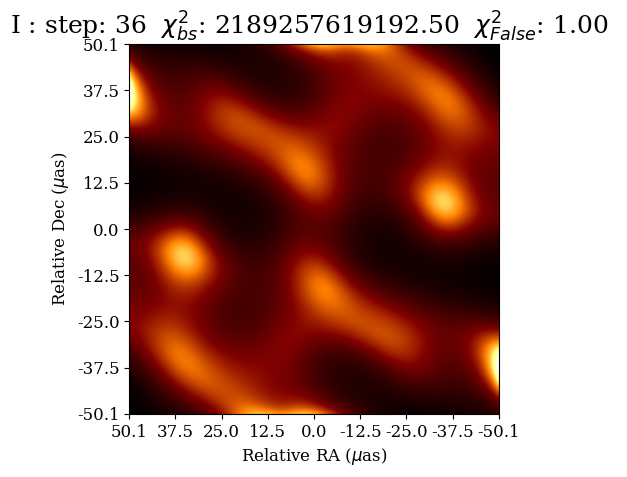

i: 37 chi2_1: 2179687326337.69 chi2_2: 1.00 chi2_3: 1.00 s_1: 102861.97 s_2: 0.00 s_3: 0.00


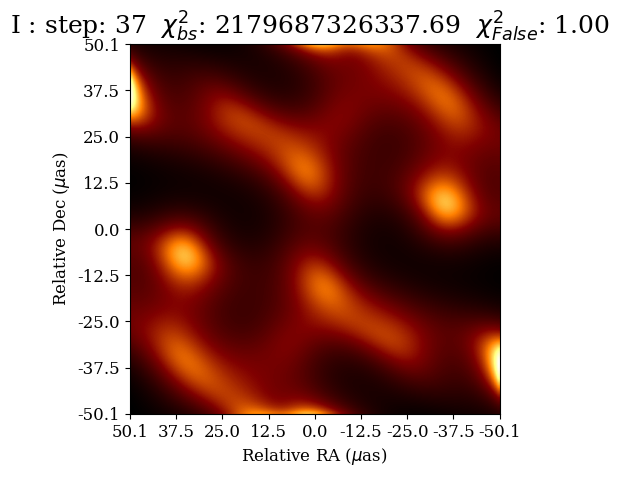

i: 38 chi2_1: 2156691761106.98 chi2_2: 1.00 chi2_3: 1.00 s_1: 107819.01 s_2: 0.00 s_3: 0.00


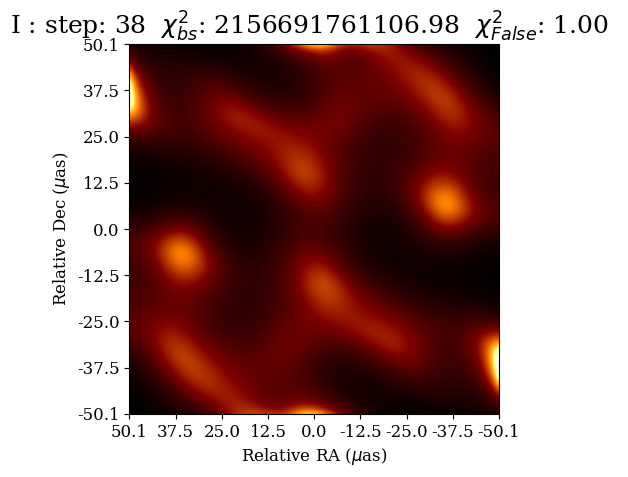

i: 39 chi2_1: 2125179790499.68 chi2_2: 1.00 chi2_3: 1.00 s_1: 118131.63 s_2: 0.00 s_3: 0.00


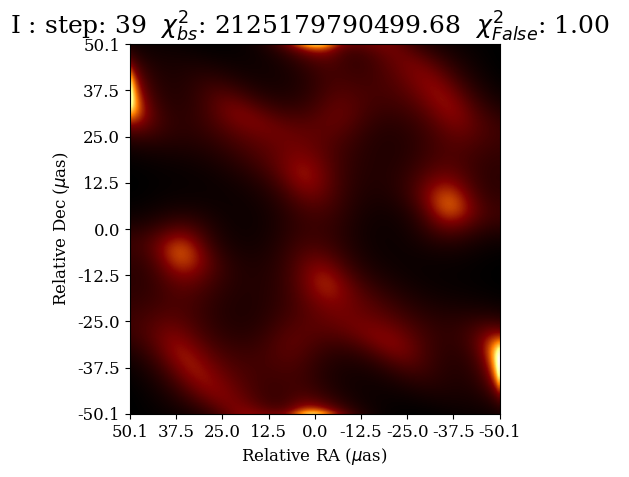

i: 40 chi2_1: 2100375385965.88 chi2_2: 1.00 chi2_3: 1.00 s_1: 127686.38 s_2: 0.00 s_3: 0.00


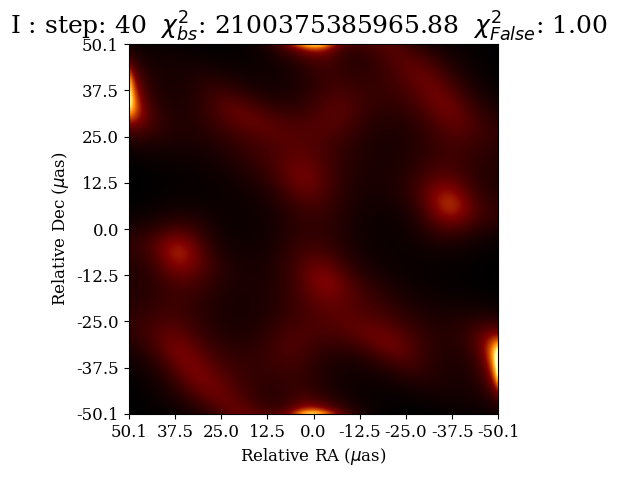

i: 41 chi2_1: 2050223829825.71 chi2_2: 1.00 chi2_3: 1.00 s_1: 143041.42 s_2: 0.00 s_3: 0.00


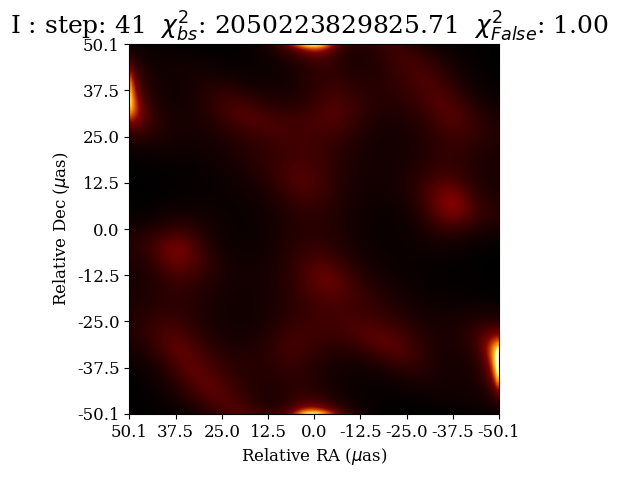

i: 42 chi2_1: 1922733614914.86 chi2_2: 1.00 chi2_3: 1.00 s_1: 144006.71 s_2: 0.00 s_3: 0.00


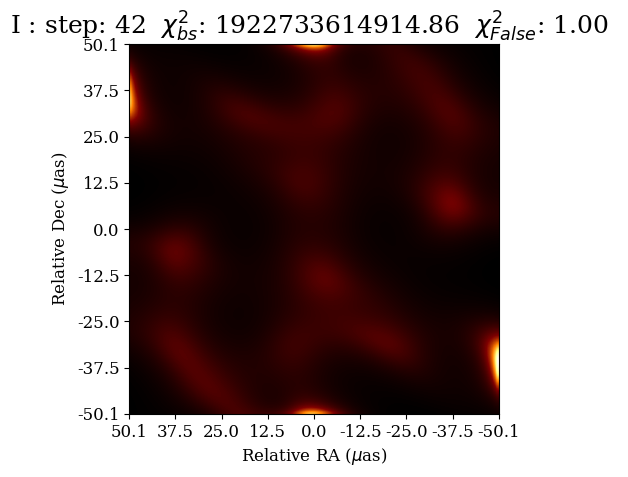

i: 43 chi2_1: 1661812256526.13 chi2_2: 1.00 chi2_3: 1.00 s_1: 162583.92 s_2: 0.00 s_3: 0.00


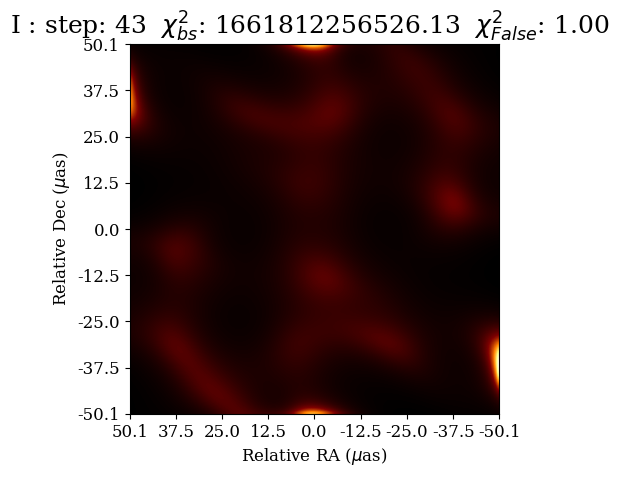

i: 44 chi2_1: 1382475769148.49 chi2_2: 1.00 chi2_3: 1.00 s_1: 158575.84 s_2: 0.00 s_3: 0.00


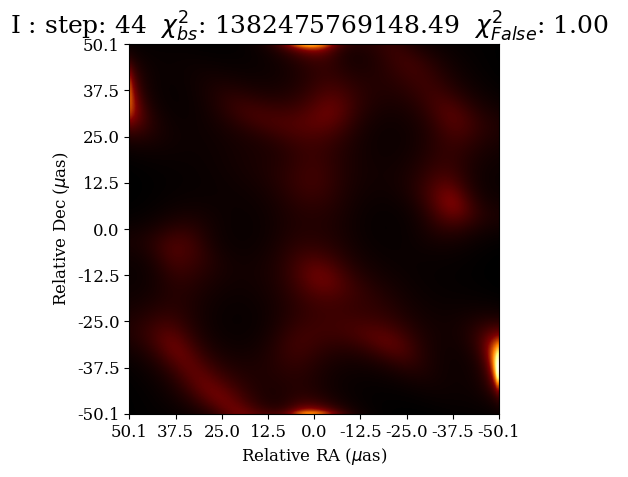

i: 45 chi2_1: 1292500425637.54 chi2_2: 1.00 chi2_3: 1.00 s_1: 137484.75 s_2: 0.00 s_3: 0.00


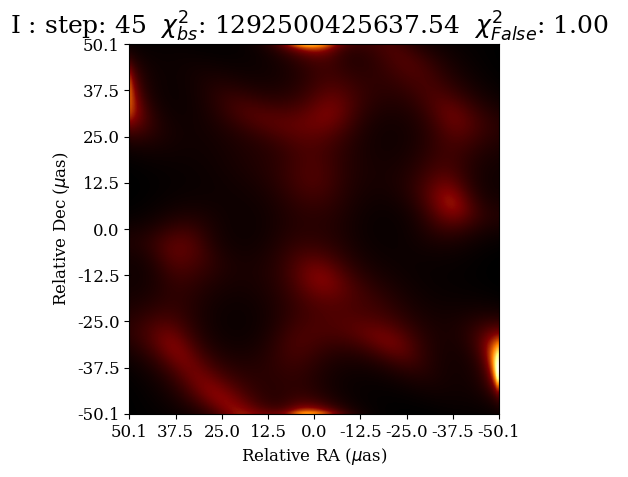

i: 46 chi2_1: 1011412122141.26 chi2_2: 1.00 chi2_3: 1.00 s_1: 130415.71 s_2: 0.00 s_3: 0.00


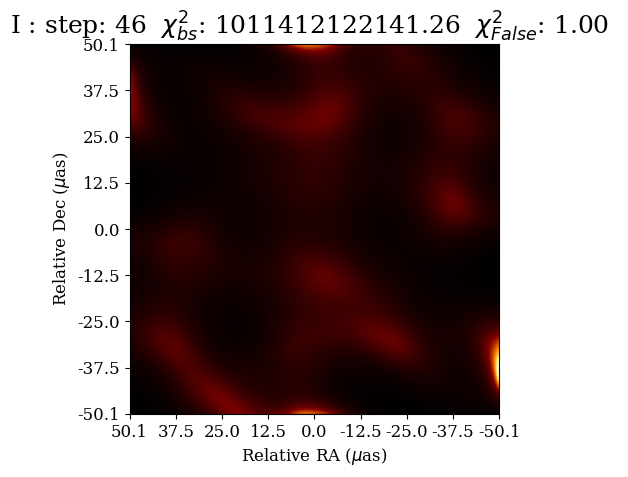

i: 47 chi2_1: 823418285702.11 chi2_2: 1.00 chi2_3: 1.00 s_1: 129570.44 s_2: 0.00 s_3: 0.00


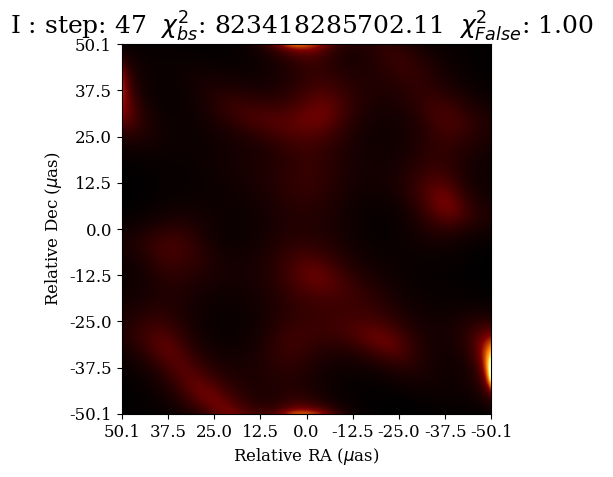

i: 48 chi2_1: 746964705495.65 chi2_2: 1.00 chi2_3: 1.00 s_1: 129752.73 s_2: 0.00 s_3: 0.00


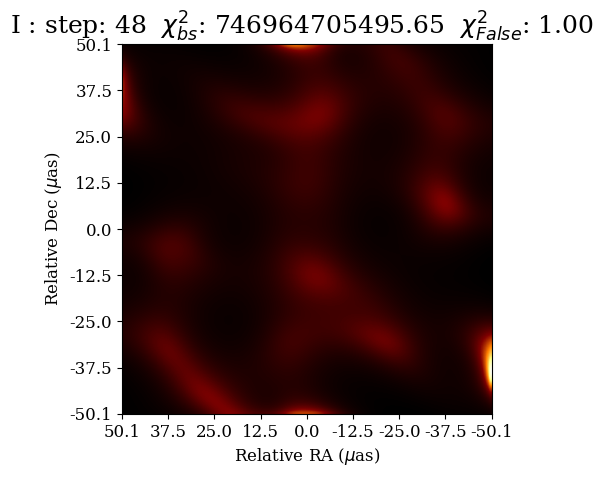

i: 49 chi2_1: 709542303252.78 chi2_2: 1.00 chi2_3: 1.00 s_1: 136277.95 s_2: 0.00 s_3: 0.00


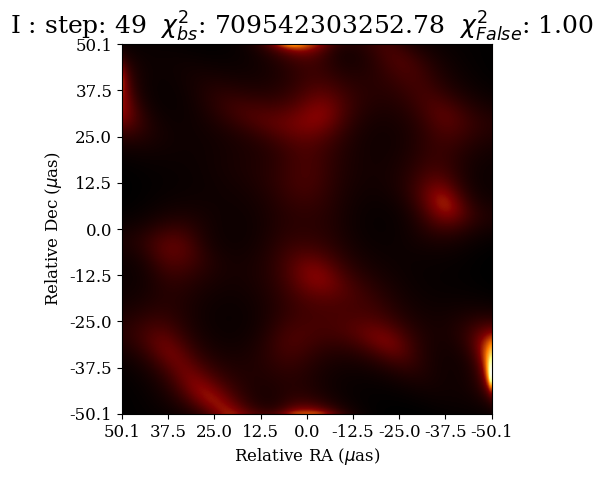

i: 50 chi2_1: 688012223073.86 chi2_2: 1.00 chi2_3: 1.00 s_1: 144929.62 s_2: 0.00 s_3: 0.00


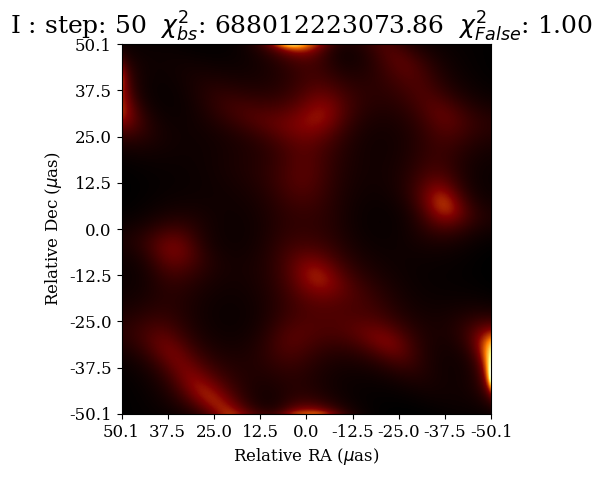

i: 51 chi2_1: 631823338329.73 chi2_2: 1.00 chi2_3: 1.00 s_1: 139315.65 s_2: 0.00 s_3: 0.00


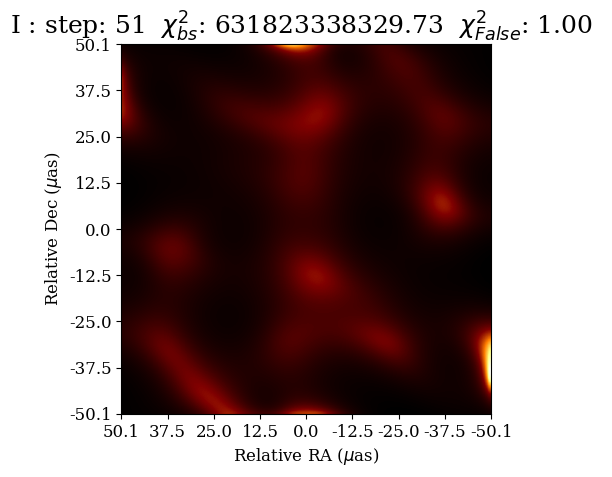

i: 52 chi2_1: 606183113678.85 chi2_2: 1.00 chi2_3: 1.00 s_1: 141271.16 s_2: 0.00 s_3: 0.00


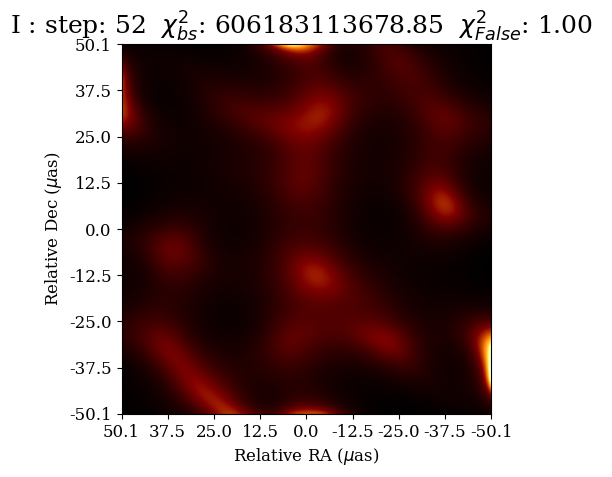

i: 53 chi2_1: 581462769567.62 chi2_2: 1.00 chi2_3: 1.00 s_1: 138187.76 s_2: 0.00 s_3: 0.00


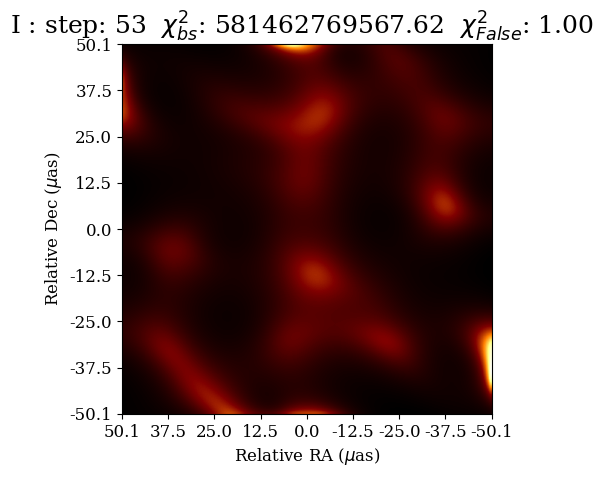

i: 54 chi2_1: 556667710618.97 chi2_2: 1.00 chi2_3: 1.00 s_1: 133721.69 s_2: 0.00 s_3: 0.00


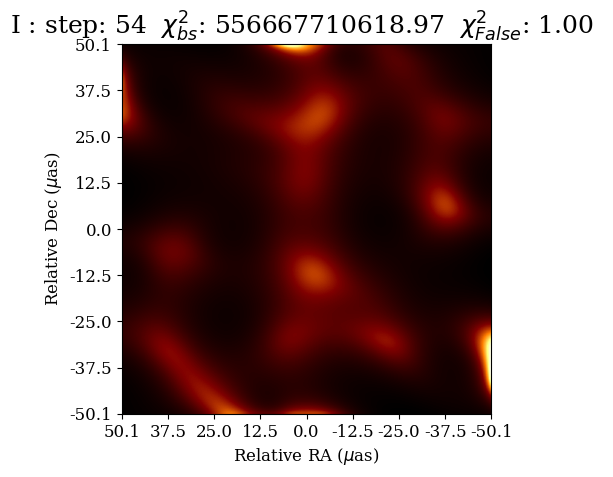

i: 55 chi2_1: 530012874289.78 chi2_2: 1.00 chi2_3: 1.00 s_1: 128081.24 s_2: 0.00 s_3: 0.00


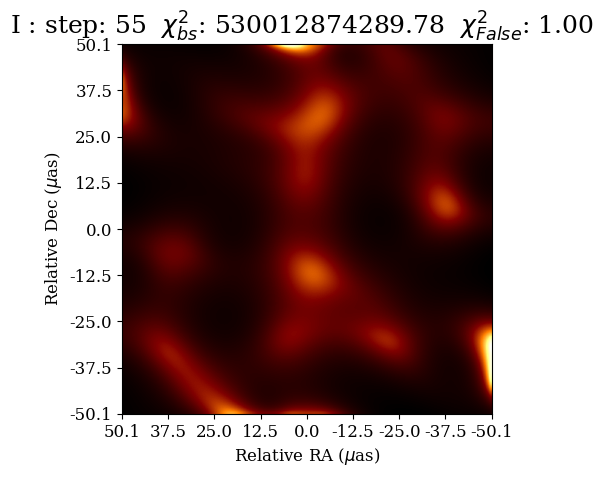

i: 56 chi2_1: 510864554210.92 chi2_2: 1.00 chi2_3: 1.00 s_1: 125548.81 s_2: 0.00 s_3: 0.00


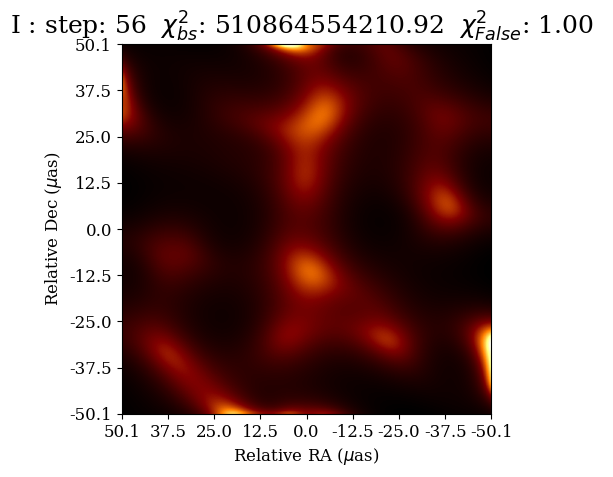

i: 57 chi2_1: 494670883126.96 chi2_2: 1.00 chi2_3: 1.00 s_1: 120824.96 s_2: 0.00 s_3: 0.00


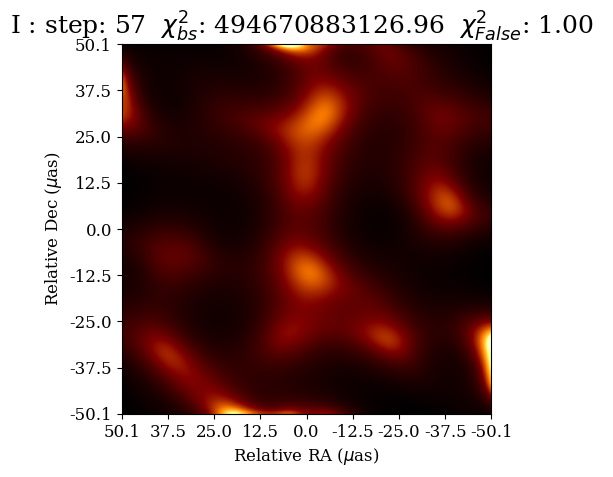

i: 58 chi2_1: 488541833599.08 chi2_2: 1.00 chi2_3: 1.00 s_1: 120291.07 s_2: 0.00 s_3: 0.00


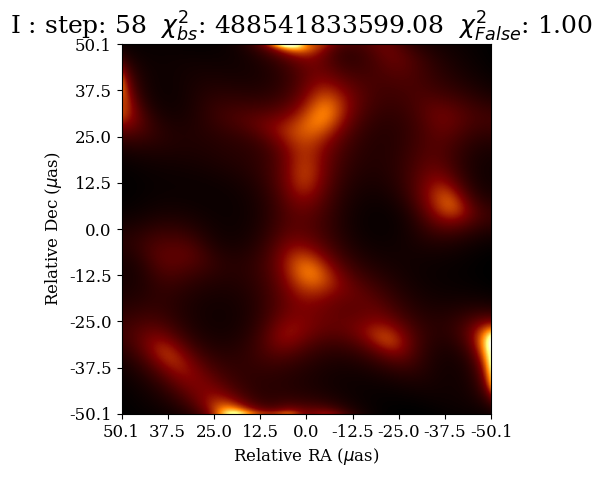

i: 59 chi2_1: 480904082775.88 chi2_2: 1.00 chi2_3: 1.00 s_1: 120029.12 s_2: 0.00 s_3: 0.00


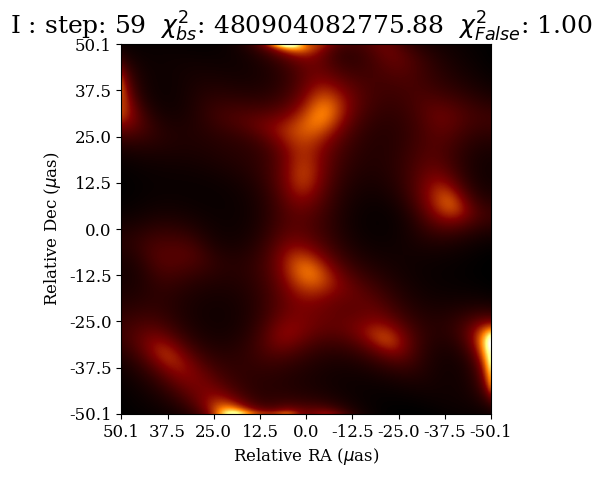

i: 60 chi2_1: 471751531699.93 chi2_2: 1.00 chi2_3: 1.00 s_1: 119292.02 s_2: 0.00 s_3: 0.00


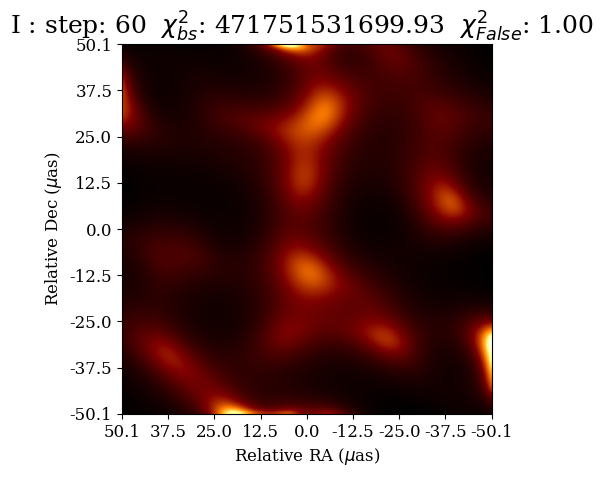

i: 61 chi2_1: 456753811648.25 chi2_2: 1.00 chi2_3: 1.00 s_1: 118712.58 s_2: 0.00 s_3: 0.00


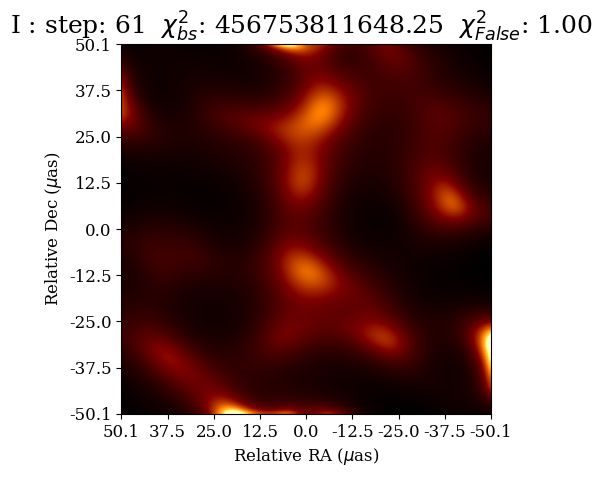

i: 62 chi2_1: 442872049838.43 chi2_2: 1.00 chi2_3: 1.00 s_1: 118286.66 s_2: 0.00 s_3: 0.00


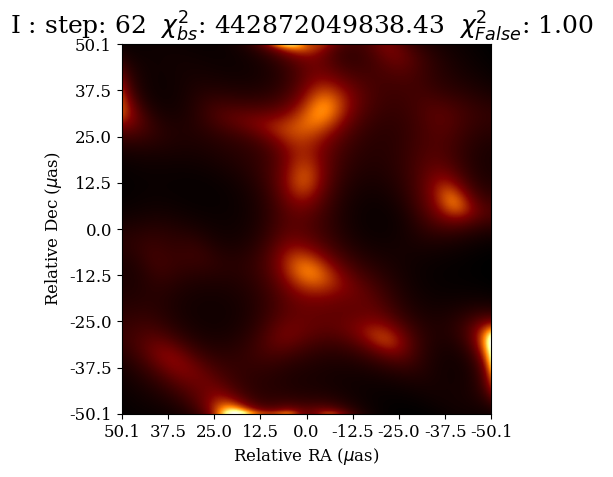

i: 63 chi2_1: 424176142067.98 chi2_2: 1.00 chi2_3: 1.00 s_1: 117236.66 s_2: 0.00 s_3: 0.00


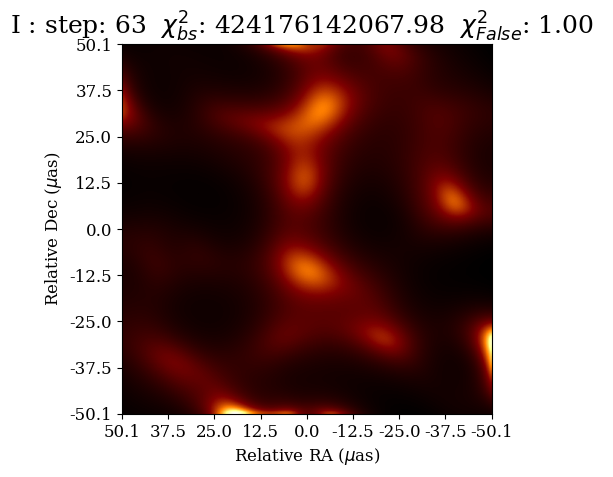

i: 64 chi2_1: 395123866981.54 chi2_2: 1.00 chi2_3: 1.00 s_1: 116894.48 s_2: 0.00 s_3: 0.00


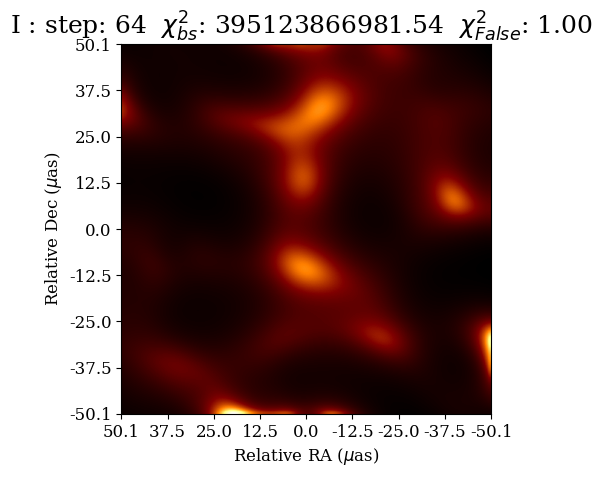

i: 65 chi2_1: 377934951085.64 chi2_2: 1.00 chi2_3: 1.00 s_1: 117112.58 s_2: 0.00 s_3: 0.00


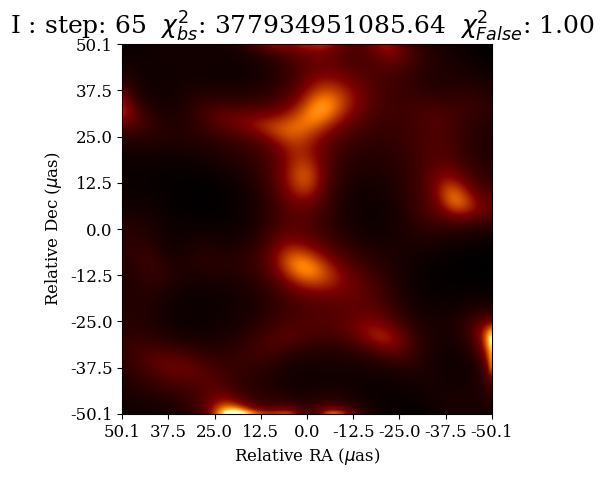

i: 66 chi2_1: 360583210632.38 chi2_2: 1.00 chi2_3: 1.00 s_1: 117692.90 s_2: 0.00 s_3: 0.00


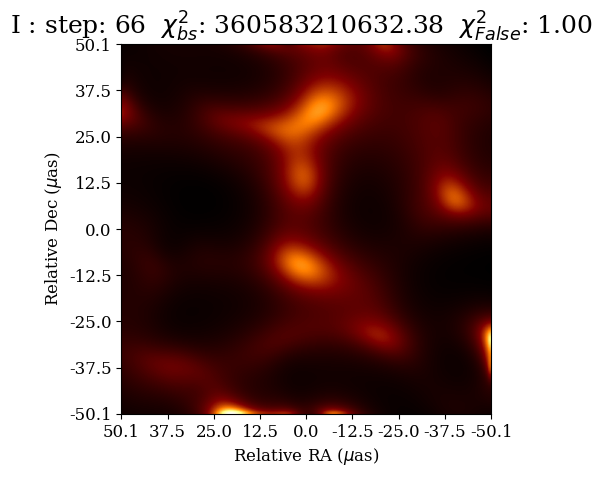

i: 67 chi2_1: 354318558052.14 chi2_2: 1.00 chi2_3: 1.00 s_1: 122002.93 s_2: 0.00 s_3: 0.00


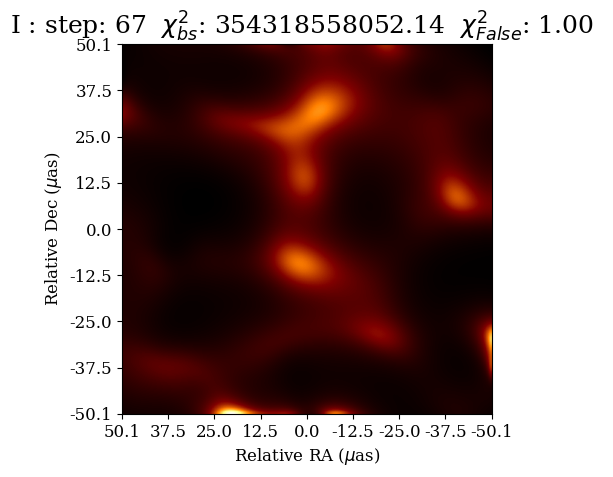

i: 68 chi2_1: 353449177968.82 chi2_2: 1.00 chi2_3: 1.00 s_1: 114022.52 s_2: 0.00 s_3: 0.00


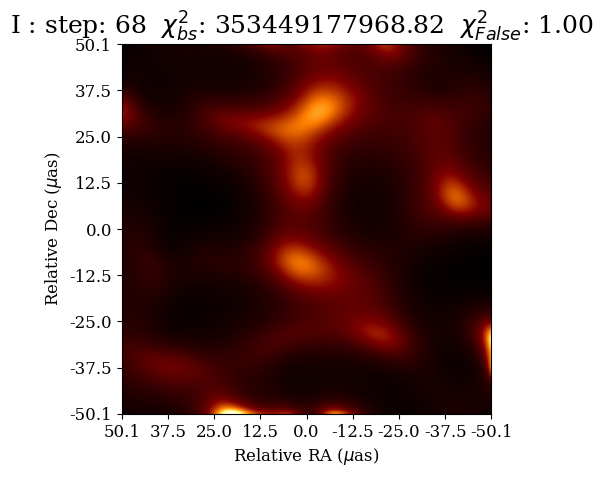

i: 69 chi2_1: 336928200201.78 chi2_2: 1.00 chi2_3: 1.00 s_1: 116022.39 s_2: 0.00 s_3: 0.00


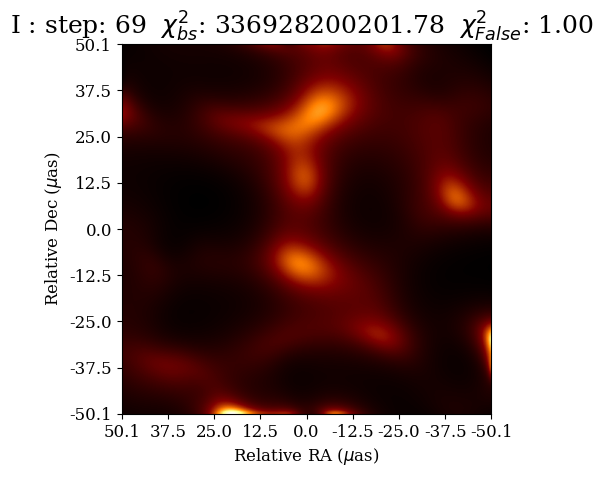

i: 70 chi2_1: 331470729374.15 chi2_2: 1.00 chi2_3: 1.00 s_1: 118992.60 s_2: 0.00 s_3: 0.00


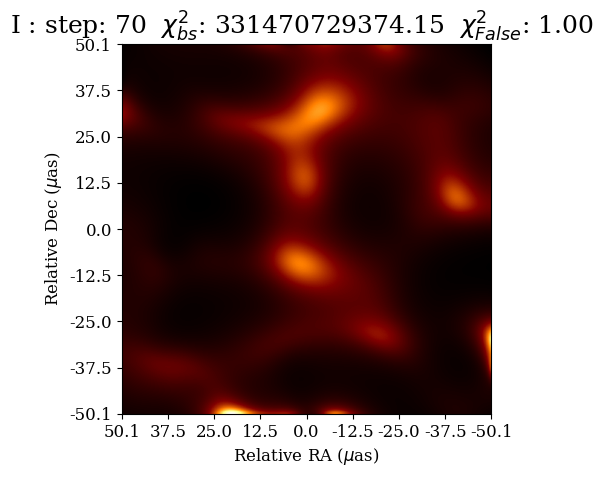

i: 71 chi2_1: 322688682225.03 chi2_2: 1.00 chi2_3: 1.00 s_1: 120072.68 s_2: 0.00 s_3: 0.00


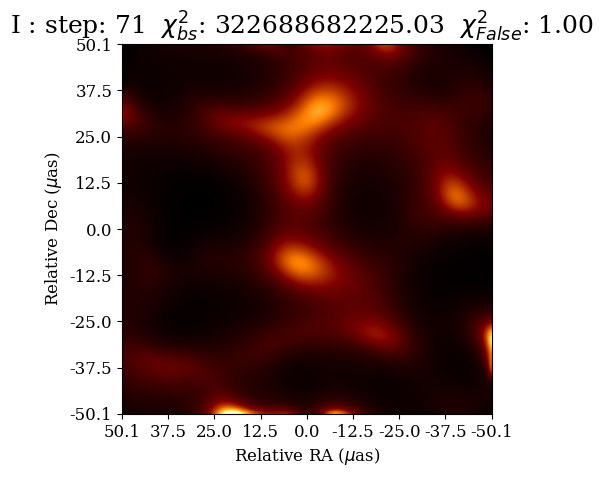

i: 72 chi2_1: 304158241220.05 chi2_2: 1.00 chi2_3: 1.00 s_1: 122337.36 s_2: 0.00 s_3: 0.00


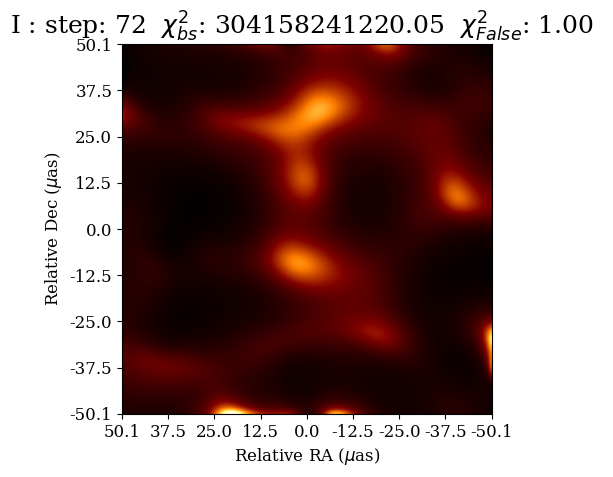

i: 73 chi2_1: 282865037543.25 chi2_2: 1.00 chi2_3: 1.00 s_1: 123629.70 s_2: 0.00 s_3: 0.00


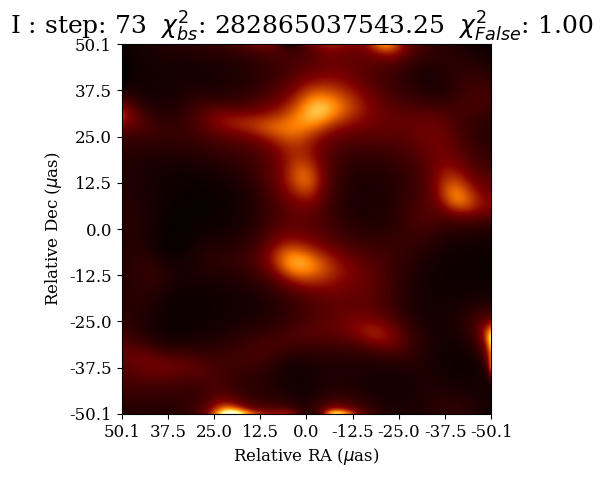

i: 74 chi2_1: 262518237456.66 chi2_2: 1.00 chi2_3: 1.00 s_1: 129509.45 s_2: 0.00 s_3: 0.00


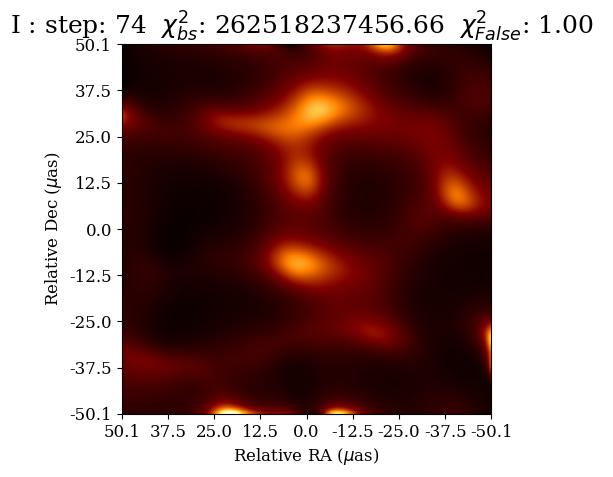

i: 75 chi2_1: 248317933547.12 chi2_2: 1.00 chi2_3: 1.00 s_1: 128004.95 s_2: 0.00 s_3: 0.00


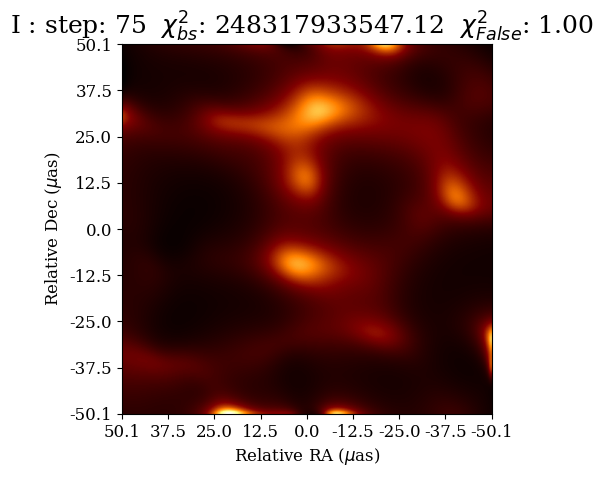

i: 76 chi2_1: 238642286973.86 chi2_2: 1.00 chi2_3: 1.00 s_1: 130525.00 s_2: 0.00 s_3: 0.00


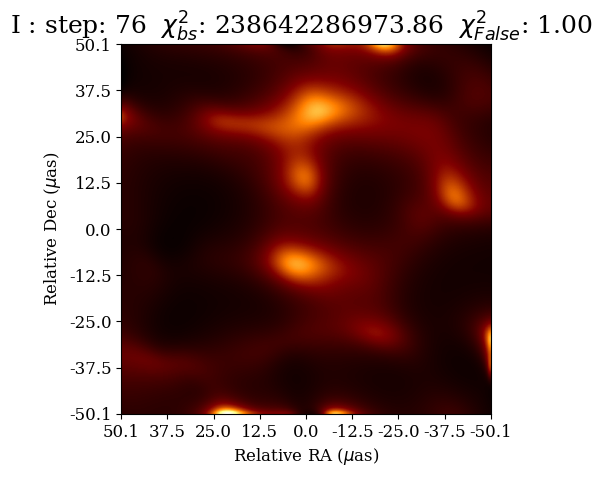

i: 77 chi2_1: 230818886860.41 chi2_2: 1.00 chi2_3: 1.00 s_1: 130771.92 s_2: 0.00 s_3: 0.00


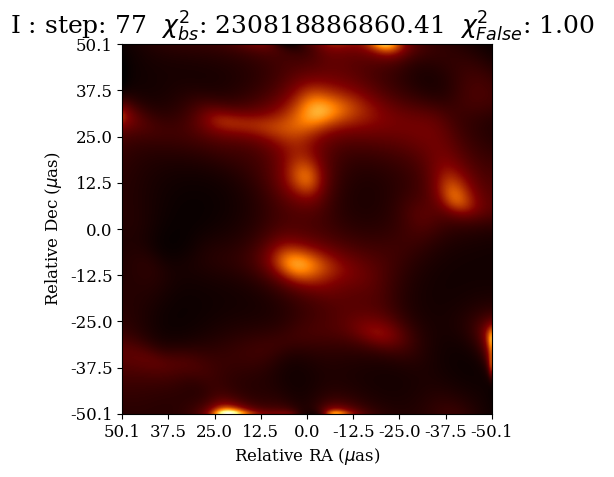

i: 78 chi2_1: 224409111844.18 chi2_2: 1.00 chi2_3: 1.00 s_1: 132004.35 s_2: 0.00 s_3: 0.00


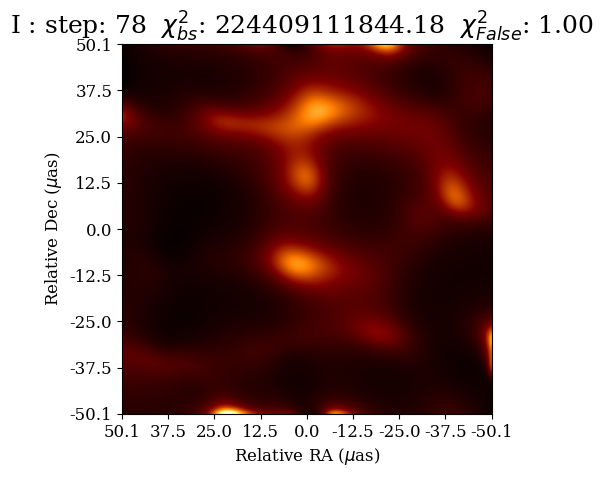

i: 79 chi2_1: 209430564055.73 chi2_2: 1.00 chi2_3: 1.00 s_1: 136072.47 s_2: 0.00 s_3: 0.00


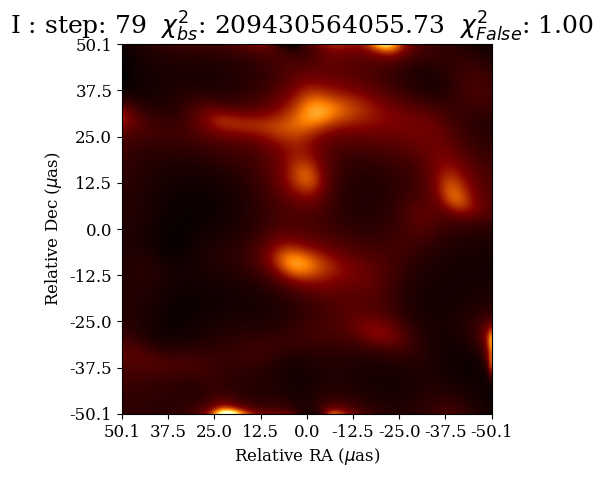

i: 80 chi2_1: 196502189805.67 chi2_2: 1.00 chi2_3: 1.00 s_1: 140181.02 s_2: 0.00 s_3: 0.00


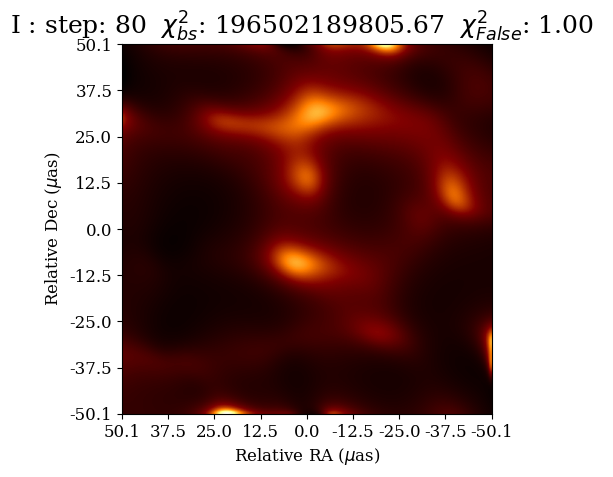

i: 81 chi2_1: 185794630852.15 chi2_2: 1.00 chi2_3: 1.00 s_1: 144156.76 s_2: 0.00 s_3: 0.00


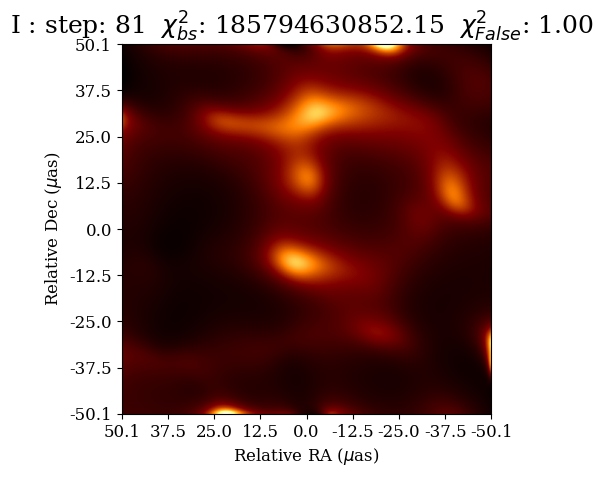

i: 82 chi2_1: 179266900797.95 chi2_2: 1.00 chi2_3: 1.00 s_1: 148265.56 s_2: 0.00 s_3: 0.00


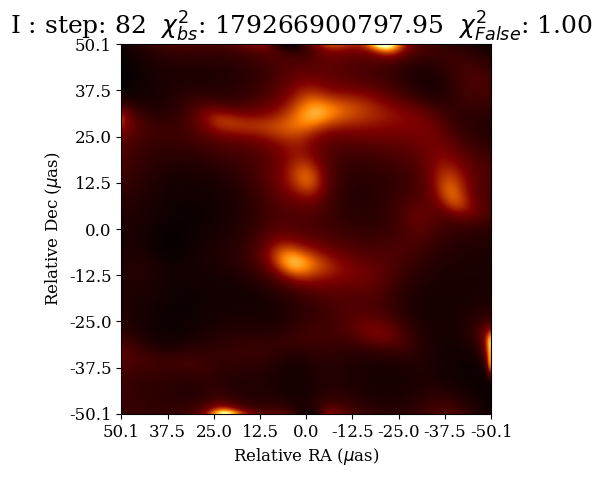

i: 83 chi2_1: 173205000443.32 chi2_2: 1.00 chi2_3: 1.00 s_1: 148971.55 s_2: 0.00 s_3: 0.00


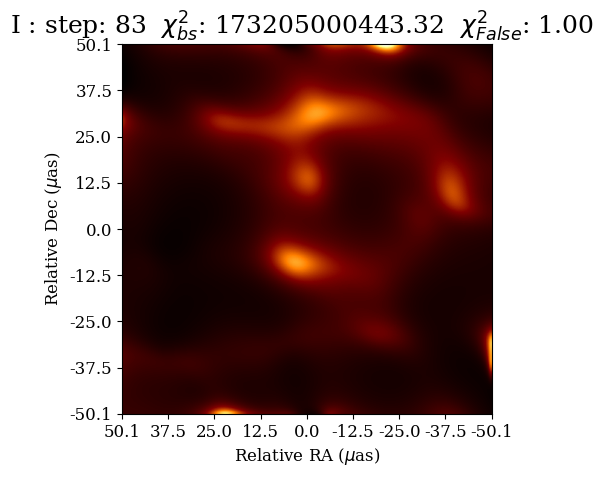

i: 84 chi2_1: 161187615027.86 chi2_2: 1.00 chi2_3: 1.00 s_1: 157086.39 s_2: 0.00 s_3: 0.00


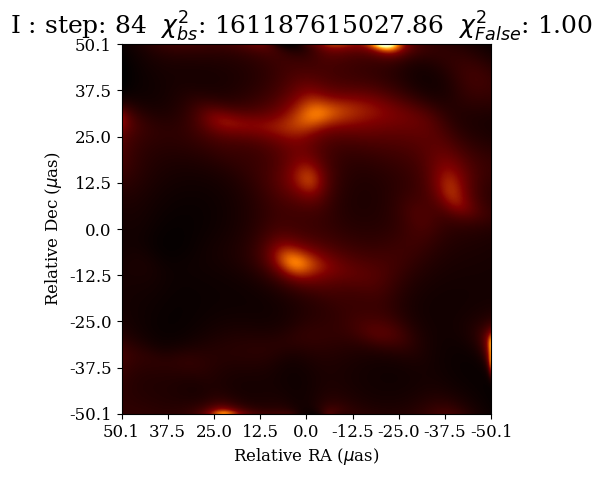

i: 85 chi2_1: 151416090408.96 chi2_2: 1.00 chi2_3: 1.00 s_1: 157320.39 s_2: 0.00 s_3: 0.00


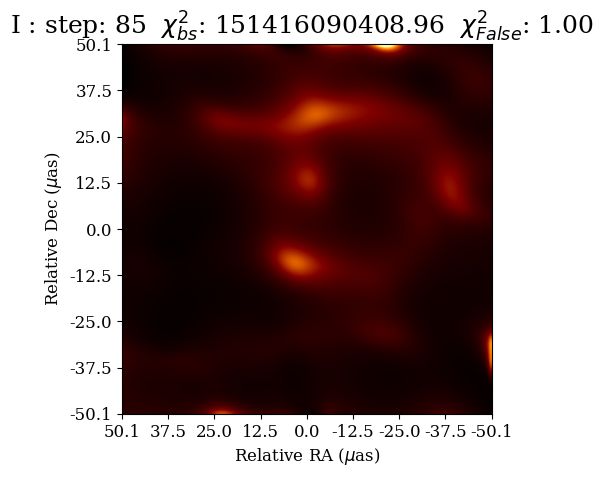

i: 86 chi2_1: 142281594647.71 chi2_2: 1.00 chi2_3: 1.00 s_1: 163651.58 s_2: 0.00 s_3: 0.00


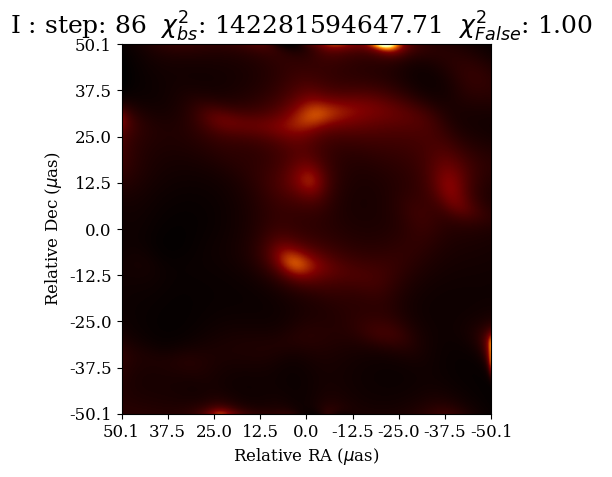

i: 87 chi2_1: 133775843097.88 chi2_2: 1.00 chi2_3: 1.00 s_1: 169401.89 s_2: 0.00 s_3: 0.00


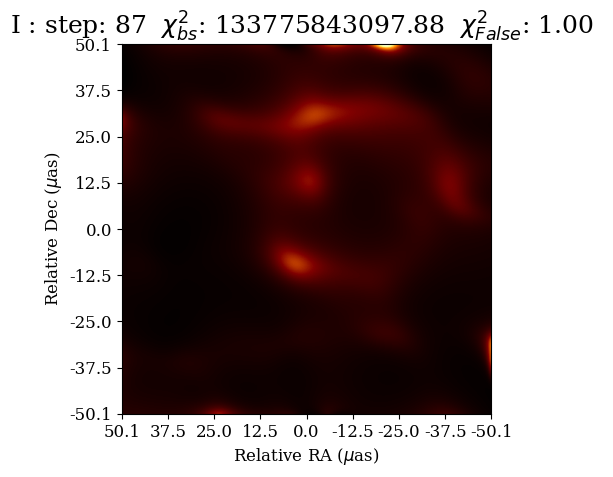

i: 88 chi2_1: 128284576811.00 chi2_2: 1.00 chi2_3: 1.00 s_1: 169717.39 s_2: 0.00 s_3: 0.00


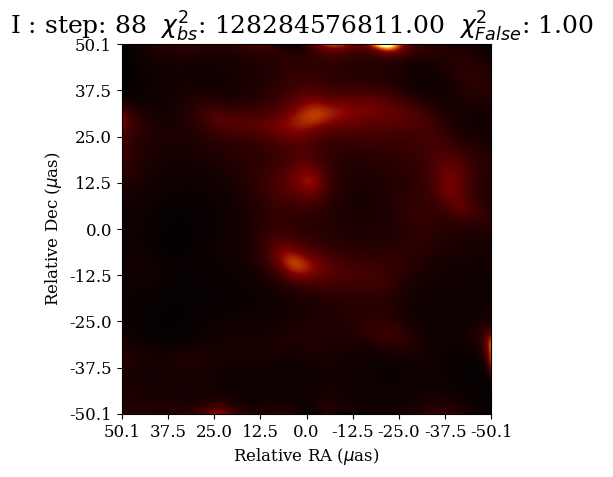

i: 89 chi2_1: 121473435580.05 chi2_2: 1.00 chi2_3: 1.00 s_1: 171408.60 s_2: 0.00 s_3: 0.00


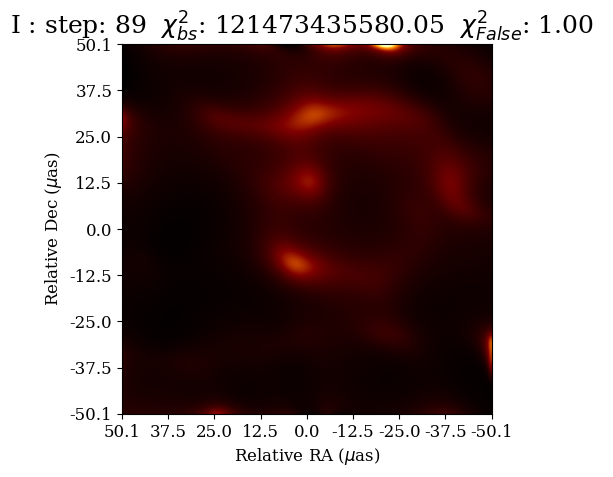

i: 90 chi2_1: 115302069617.90 chi2_2: 1.00 chi2_3: 1.00 s_1: 173419.10 s_2: 0.00 s_3: 0.00


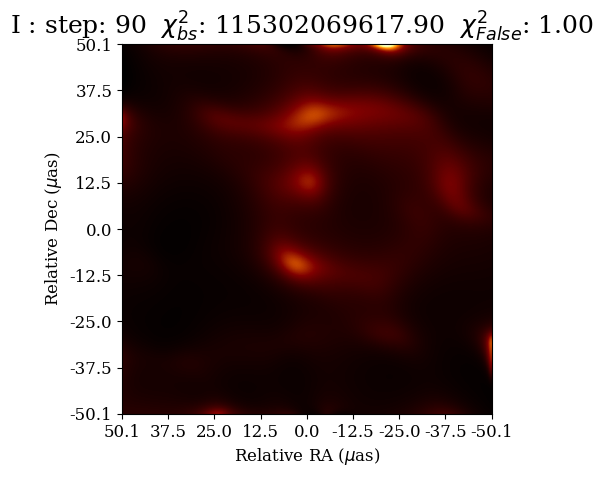

i: 91 chi2_1: 112501400605.00 chi2_2: 1.00 chi2_3: 1.00 s_1: 175621.57 s_2: 0.00 s_3: 0.00


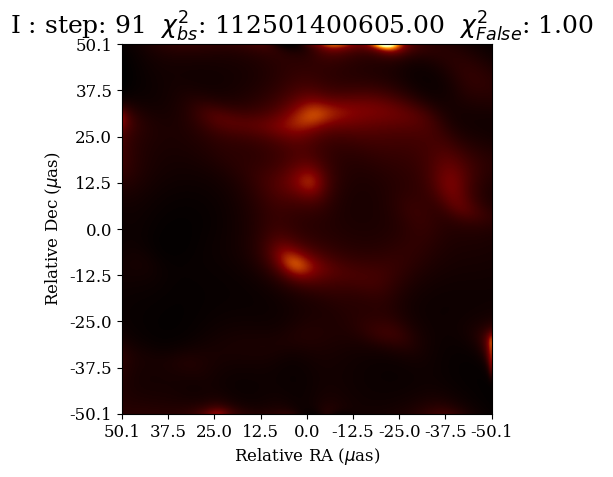

i: 92 chi2_1: 110434100002.52 chi2_2: 1.00 chi2_3: 1.00 s_1: 175144.91 s_2: 0.00 s_3: 0.00


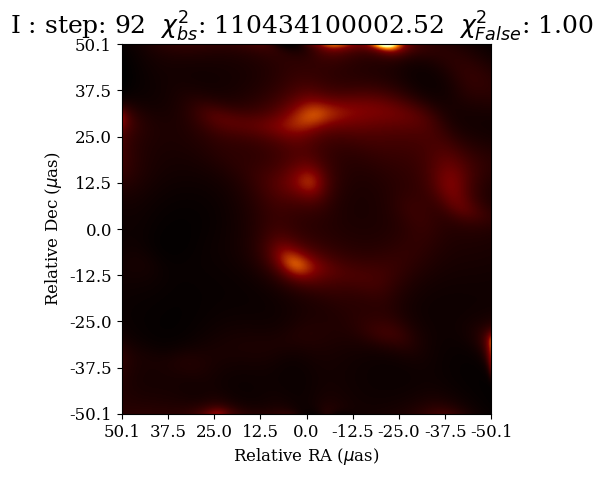

i: 93 chi2_1: 106750852107.23 chi2_2: 1.00 chi2_3: 1.00 s_1: 175941.97 s_2: 0.00 s_3: 0.00


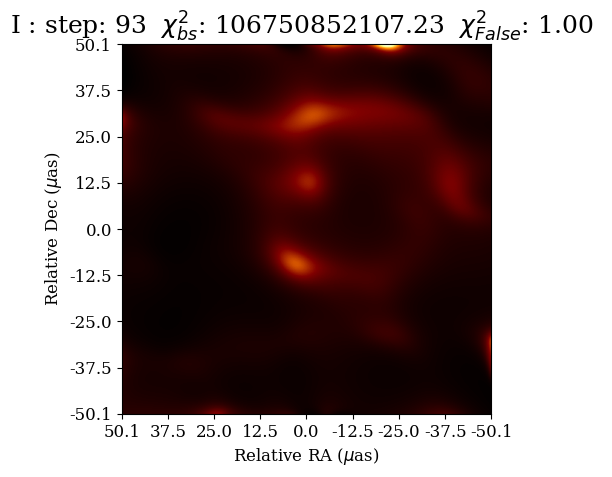

i: 94 chi2_1: 99286896350.00 chi2_2: 1.00 chi2_3: 1.00 s_1: 174914.54 s_2: 0.00 s_3: 0.00


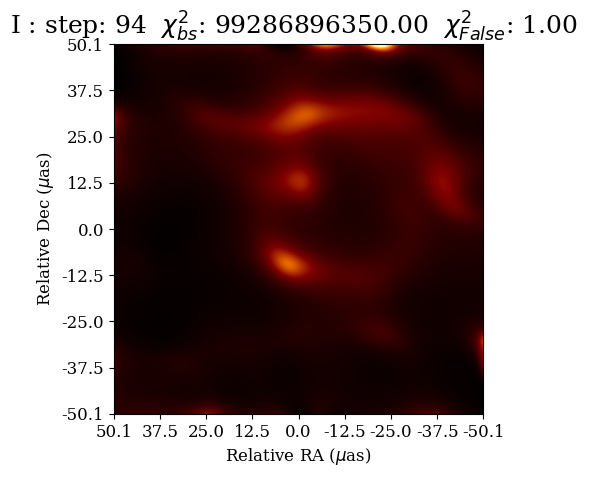

i: 95 chi2_1: 95448421801.62 chi2_2: 1.00 chi2_3: 1.00 s_1: 172943.36 s_2: 0.00 s_3: 0.00


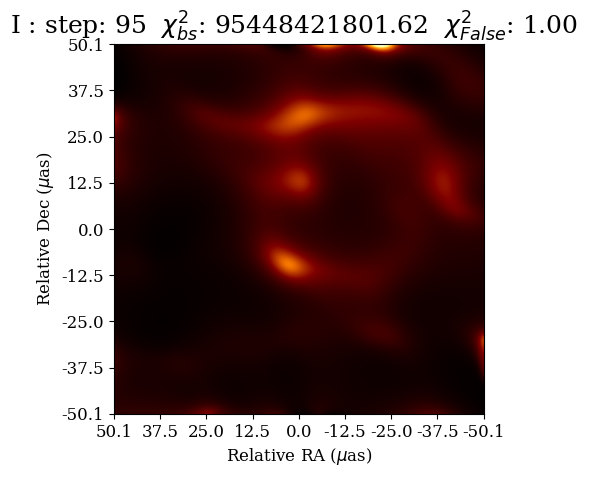

i: 96 chi2_1: 92389467062.06 chi2_2: 1.00 chi2_3: 1.00 s_1: 173710.95 s_2: 0.00 s_3: 0.00


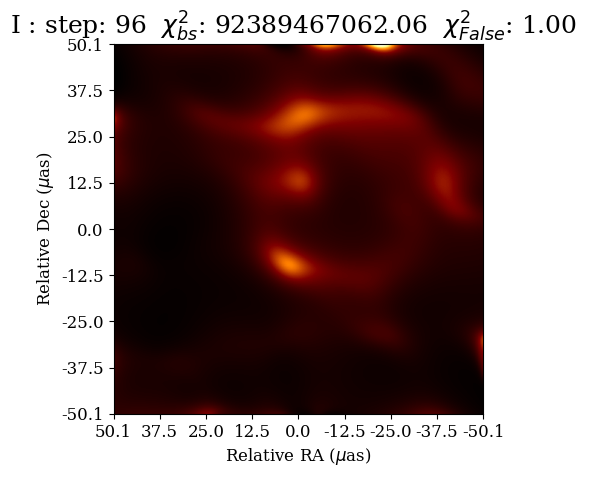

i: 97 chi2_1: 86229038936.24 chi2_2: 1.00 chi2_3: 1.00 s_1: 172871.74 s_2: 0.00 s_3: 0.00


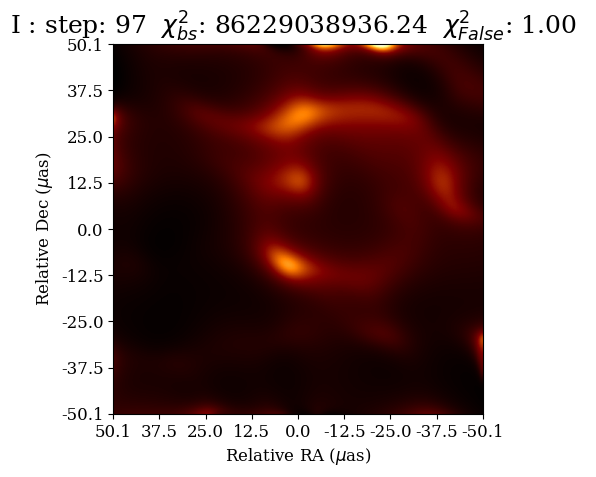

i: 98 chi2_1: 80265580660.91 chi2_2: 1.00 chi2_3: 1.00 s_1: 179480.74 s_2: 0.00 s_3: 0.00


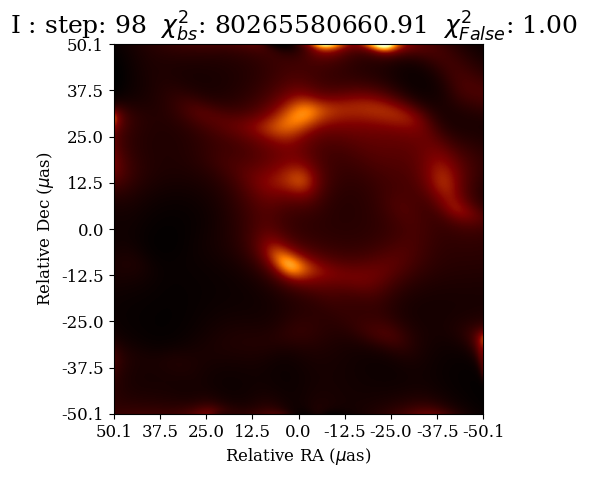

i: 99 chi2_1: 75123421513.46 chi2_2: 1.00 chi2_3: 1.00 s_1: 174840.18 s_2: 0.00 s_3: 0.00


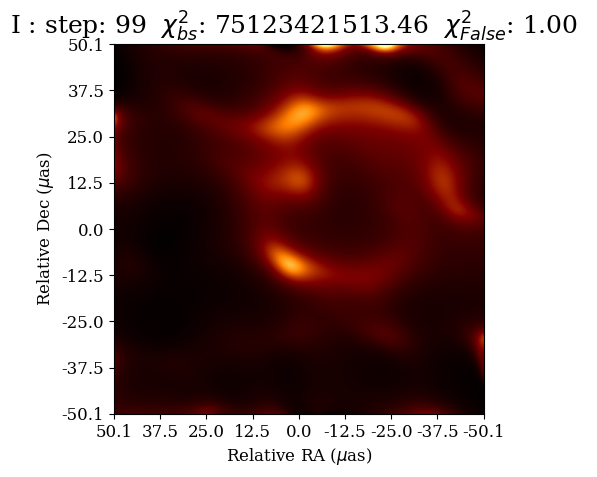

i: 100 chi2_1: 72213000386.07 chi2_2: 1.00 chi2_3: 1.00 s_1: 175731.33 s_2: 0.00 s_3: 0.00
time: 92.871213 s
J: 7721219944705.465820
Final Chi^2_1: 72213000386.071243 Chi^2_2: 1.000000  Chi^2_3: 1.000000
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT


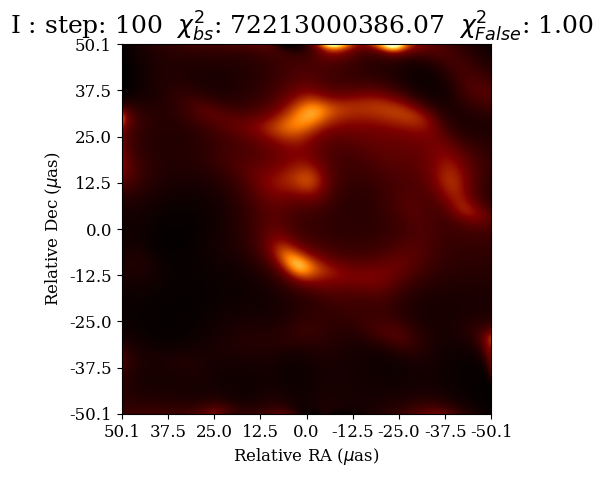

In [5]:
npix = 32
fov = 1.2*im.xdim * im.psize # slightly enlarge the field of view
#dim = obs.dirtyimage(npix, fov)
#dbeam = obs.dirtybeam(npix, fov)
#cbeam = obs.cleanbeam(npix,fov)
#dim.display()
#dbeam.display()
#cbeam.display()

# Resolution
beamparams = obs.fit_beam() # fitted beam parameters (fwhm_maj, fwhm_min, theta) in radians
res = obs.res() # nominal array resolution, 1/longest baseline
print("Clean beam parameters: " , beamparams)
print("Nominal Resolution: " ,res)

# Export the visibility data to uvfits/text
#obs.save_txt('obs.txt') # exports a text file with the visibilities
#obs.save_uvfits('obs.uvp') # exports a UVFITS file modeled on template.UVP

# Generate an image prior
npix = 128
fov = 1*im.fovx()
zbl = im.total_flux() # total flux
prior_fwhm = 200*eh.RADPERUAS # Gaussian size in microarcssec
emptyprior = eh.image.make_square(obs, npix, fov)
flatprior = emptyprior.add_flat(zbl)
gaussprior = emptyprior.add_gauss(zbl, (prior_fwhm, prior_fwhm, 0, 0, 0))

# Image total flux with bispectrum
flux = zbl
tt = time.time()
out  = eh.imager_func(obs, gaussprior, gaussprior, flux,
                      d1='bs', s1='simple',
                      alpha_s1=1, alpha_d1=100,
                      alpha_flux=100, alpha_cm=50,
                      maxit=100, ttype=ttype, show_updates=True)

In [6]:
# Blur the image with a circular beam and image again to help convergance
out = out.blur_circ(res)
out = eh.imager_func(obs, out, out, flux,
                d1='bs', s1='tv',
                alpha_s1=1, alpha_d1=50,
                alpha_flux=100, alpha_cm=50,
                maxit=100,ttype=ttype, show_updates=False)

out = out.blur_circ(res/2.0)
out = eh.imager_func(obs, out, out, flux,
                d1='bs', s1='tv',
                alpha_s1=1, alpha_d1=10,
                alpha_flux=100, alpha_cm=50,
                maxit=100,ttype=ttype, show_updates=False)

print ("total time: ", time.time() - tt)

Generating I image...
Initial S_1: 12628.591580 S_2: 0.000000 S_3: 0.000000
Initial Chi^2_1: 4477296537162.308594 Chi^2_2: 1.000000 Chi^2_3: 1.000000
Initial Objective Function: 224364746601161.062500
Total Data 1:  645
Total Pixel #:  16384
Clipped Pixel #:  16384

time: 34.240254 s
J: 308721979648.745117
Final Chi^2_1: 5807807358.441184 Chi^2_2: 1.000000  Chi^2_3: 1.000000
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT
Generating I image...
Initial S_1: 18161.180255 S_2: 0.000000 S_3: 0.000000
Initial Chi^2_1: 1017758493162.043213 Chi^2_2: 1.000000 Chi^2_3: 1.000000
Initial Objective Function: 10195916530679.183594
Total Data 1:  645
Total Pixel #:  16384
Clipped Pixel #:  16384

time: 29.580251 s
J: 17054857042.351067
Final Chi^2_1: 1698287246.368524 Chi^2_2: 1.000000  Chi^2_3: 1.000000
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT
total time:  169.38590359687805


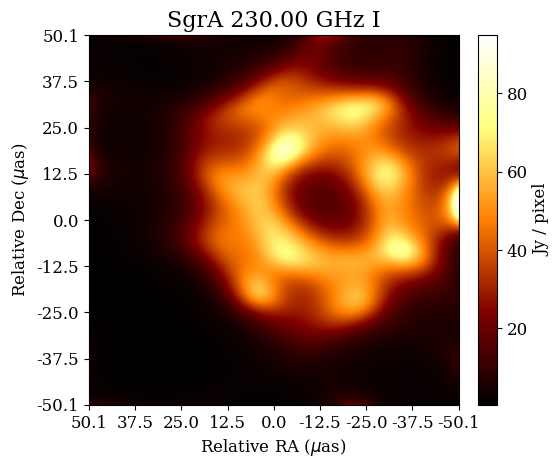

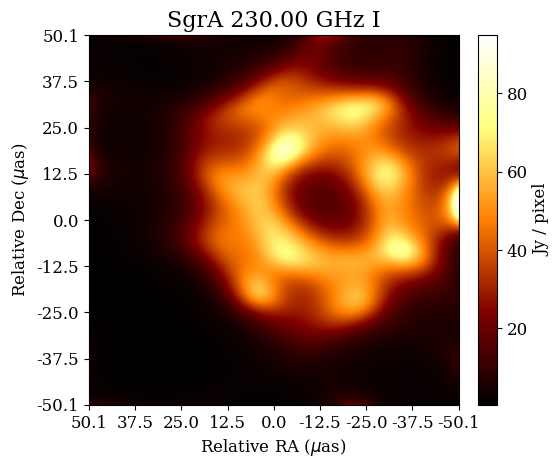

In [7]:
outblur = out.blur_gauss(beamparams, 0.5)
out.display()